##Preprocessing data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


https://www.kaggle.com/code/jameelsawafta/chest-x-ray-images-pneumonia


In [2]:
import time
import random
import glob
import torch
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, random_split
import torch.nn as nn
from torchvision.models import resnet18
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np

class XrayDataset(Dataset):
    def __init__(self, paths, labels, transform=None):
        self.paths = paths
        self.labels = labels

        if transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
            ])
        else:
            self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, index):
        path = self.paths[index]
        image = Image.open(path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        label = self.labels[index]
        return image, label

In [3]:
train_normal = glob.glob("/content/drive/Shareddrives/小圈圈/chest_xray/train/NORMAL/*")
train_pneumonia= glob.glob("/content/drive/Shareddrives/小圈圈/chest_xray/train/PNEUMONIA/*")

test_normal = glob.glob("/content/drive/Shareddrives/小圈圈/chest_xray/test/NORMAL/*")
test_pneumonia= glob.glob("/content/drive/Shareddrives/小圈圈/chest_xray/test/PNEUMONIA/*")

In [4]:
train_paths = train_normal + train_pneumonia
test_paths =  test_normal + test_pneumonia

train_labels= [0] * len(train_normal) + [1] * len(train_pneumonia)
test_labels= [0] * len(test_normal) + [1] * len(test_pneumonia)

train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.RandomResizedCrop(224),
    transforms.ToTensor(),
])

original_train_dataset = XrayDataset(train_paths, train_labels)
augmented_train_dataset = XrayDataset(train_paths, train_labels, transform=train_transform)

train_dataset = torch.utils.data.ConcatDataset([original_train_dataset, augmented_train_dataset])
test_dataset = XrayDataset(test_paths, test_labels)

#
train_size = int(0.9 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(dataset=train_dataset, lengths=[train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

len(train_loader), len(val_loader), len(test_loader)


(294, 1044, 624)

In [5]:
# Print a few more samples from the dataset
for i in range(1333, 1345):  # Print 3 samples
    img, label = train_dataset[i]
    print("Sample", i + 1, "- Image shape:", img.shape, ", Label:", label)

Sample 1334 - Image shape: torch.Size([3, 224, 224]) , Label: 0
Sample 1335 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1336 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1337 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1338 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1339 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1340 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1341 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1342 - Image shape: torch.Size([3, 224, 224]) , Label: 0
Sample 1343 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1344 - Image shape: torch.Size([3, 224, 224]) , Label: 1
Sample 1345 - Image shape: torch.Size([3, 224, 224]) , Label: 0


##Print image

Total number of samples: 9388
Sample details:
Sample 0: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 9: Label - 1, Image shape - torch.Size([3, 224, 224])


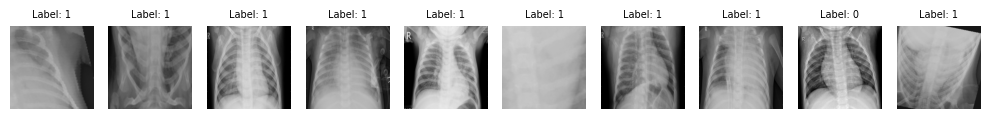

Sample 800: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 801: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 802: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 803: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 804: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 805: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 806: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 807: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 808: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 809: Label - 0, Image shape - torch.Size([3, 224, 224])


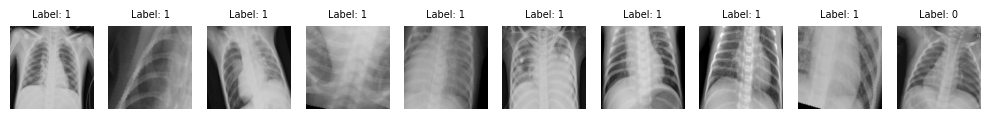

Sample 1600: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1601: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1602: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1603: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1604: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1605: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1606: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1607: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1608: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1609: Label - 1, Image shape - torch.Size([3, 224, 224])


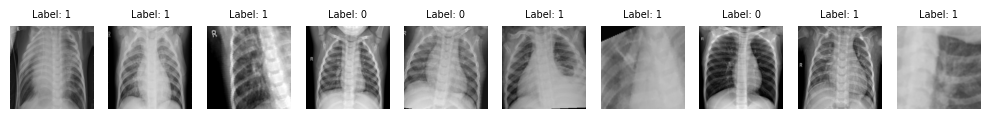

Sample 2400: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2401: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2402: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2403: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2404: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2405: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2406: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2407: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 2408: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 2409: Label - 0, Image shape - torch.Size([3, 224, 224])


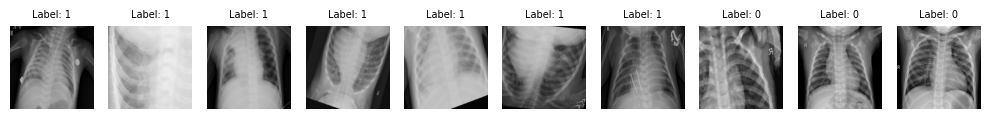

Sample 3200: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3201: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3202: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3203: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3204: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3205: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3206: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 3207: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 3208: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3209: Label - 1, Image shape - torch.Size([3, 224, 224])


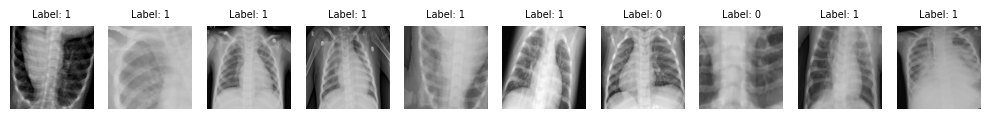

Sample 4000: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 4001: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4002: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4003: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4004: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4005: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4006: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4007: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4008: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 4009: Label - 1, Image shape - torch.Size([3, 224, 224])


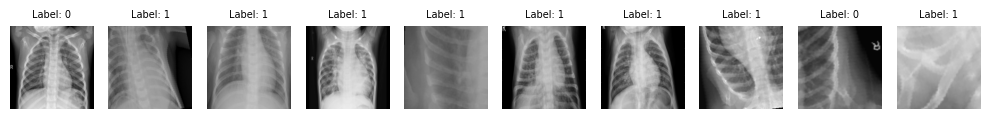

Sample 4800: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4801: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4802: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 4803: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4804: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 4805: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 4806: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4807: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4808: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4809: Label - 1, Image shape - torch.Size([3, 224, 224])


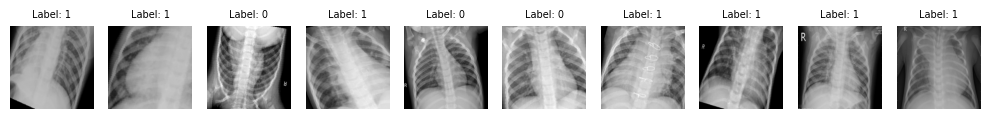

Sample 5600: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 5601: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5602: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5603: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5604: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5605: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 5606: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5607: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5608: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 5609: Label - 1, Image shape - torch.Size([3, 224, 224])


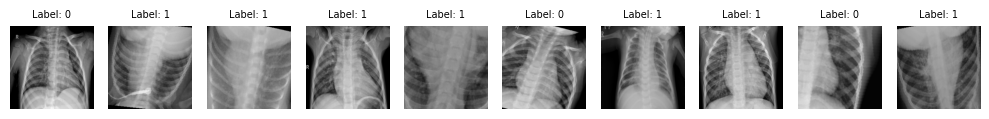

Sample 6400: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6401: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6402: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6403: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6404: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6405: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 6406: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6407: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 6408: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6409: Label - 1, Image shape - torch.Size([3, 224, 224])


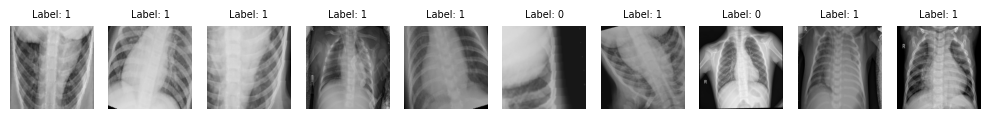

Sample 7200: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 7201: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7202: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7203: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7204: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 7205: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7206: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7207: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7208: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 7209: Label - 1, Image shape - torch.Size([3, 224, 224])


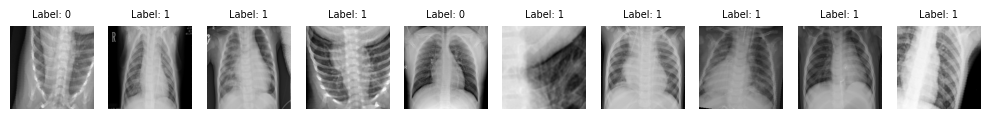

Sample 8000: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 8001: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 8002: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 8003: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8004: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 8005: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8006: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8007: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 8008: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 8009: Label - 1, Image shape - torch.Size([3, 224, 224])


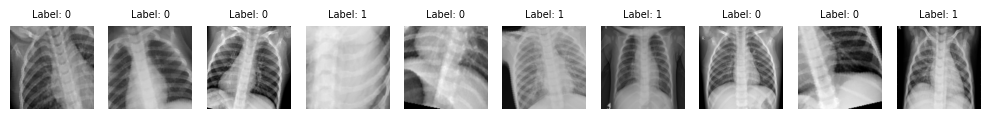

Sample 8800: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8801: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8802: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8803: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8804: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8805: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8806: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8807: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8808: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 8809: Label - 1, Image shape - torch.Size([3, 224, 224])


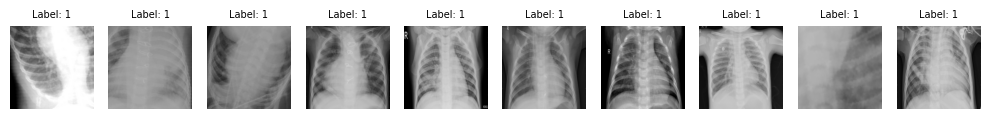

In [ ]:
# Print dataset details and display images five at a time
print(f"Total number of samples: {len(train_dataset)}")
print("Sample details:")
for i in range(0, len(train_dataset), 800):
    fig, axes = plt.subplots(1, 10, figsize=(10, 5))
    for j in range(10):
        if i + j < len(train_dataset):
            sample, label = train_dataset[i + j]
            print(f"Sample {i + j}: Label - {label}, Image shape - {sample.shape}")
            axes[j].imshow(sample.permute(1, 2, 0))  # Convert tensor back to HWC format
            axes[j].set_title(f"Label: {label}", fontsize = 7)
            axes[j].axis('off')
    plt.tight_layout()
    plt.show()

Total number of samples: 624
Sample details:
Sample 0: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 2: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 3: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 4: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 5: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 6: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 7: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 8: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 9: Label - 0, Image shape - torch.Size([3, 224, 224])


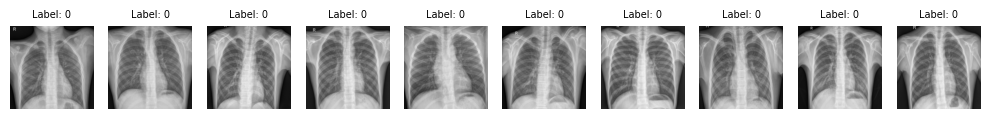

Sample 100: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 101: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 102: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 103: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 104: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 105: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 106: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 107: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 108: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 109: Label - 0, Image shape - torch.Size([3, 224, 224])


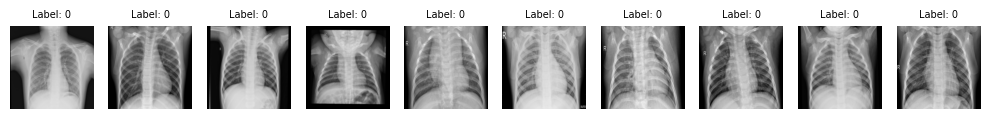

Sample 200: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 201: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 202: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 203: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 204: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 205: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 206: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 207: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 208: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 209: Label - 0, Image shape - torch.Size([3, 224, 224])


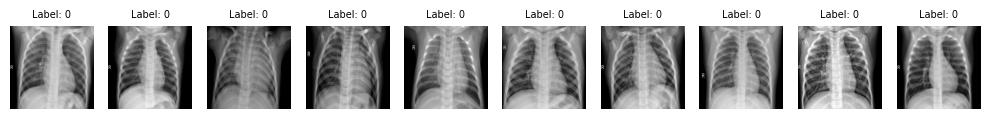

Sample 300: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 301: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 302: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 303: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 304: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 305: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 306: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 307: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 308: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 309: Label - 1, Image shape - torch.Size([3, 224, 224])


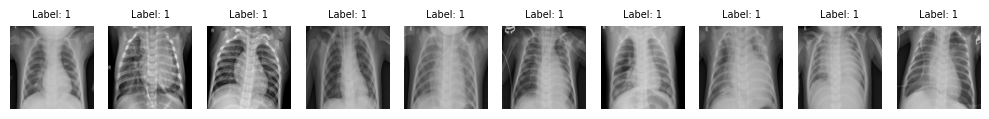

Sample 400: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 401: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 402: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 403: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 404: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 405: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 406: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 407: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 408: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 409: Label - 1, Image shape - torch.Size([3, 224, 224])


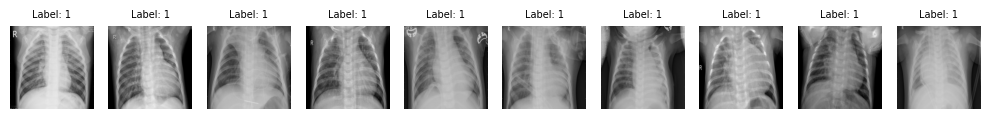

Sample 500: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 501: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 502: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 503: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 504: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 505: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 506: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 507: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 508: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 509: Label - 1, Image shape - torch.Size([3, 224, 224])


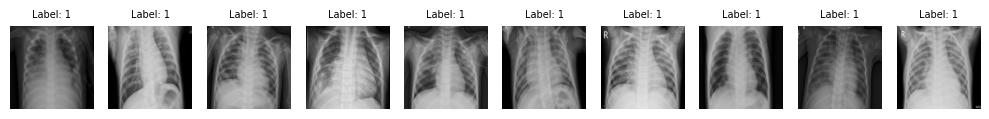

Sample 600: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 601: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 602: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 603: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 604: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 605: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 606: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 607: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 608: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 609: Label - 1, Image shape - torch.Size([3, 224, 224])


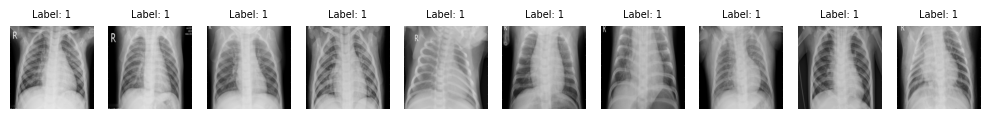

In [ ]:
# Print dataset details and display images five at a time
print(f"Total number of samples: {len(test_dataset)}")
print("Sample details:")
for i in range(0, len(test_dataset), 100):
    fig, axes = plt.subplots(1, 10, figsize=(10, 5))
    for j in range(10):
        if i + j < len(test_dataset):
            sample, label = test_dataset[i + j]
            print(f"Sample {i + j}: Label - {label}, Image shape - {sample.shape}")
            axes[j].imshow(sample.permute(1, 2, 0))  # Convert tensor back to HWC format
            axes[j].set_title(f"Label: {label}", fontsize = 7)
            axes[j].axis('off')
    plt.tight_layout()
    plt.show()

Total number of samples: 1044
Sample details:
Sample 0: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 2: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 3: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 4: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 5: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 6: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 7: Label - 0, Image shape - torch.Size([3, 224, 224])


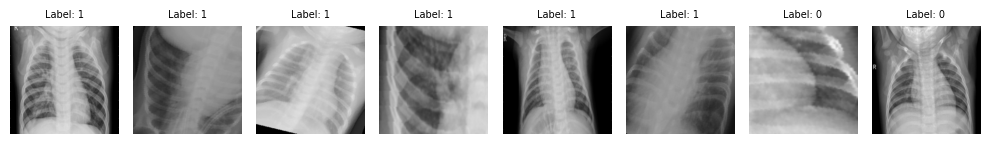

Sample 8: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 9: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 10: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 11: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 12: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 13: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 14: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 15: Label - 1, Image shape - torch.Size([3, 224, 224])


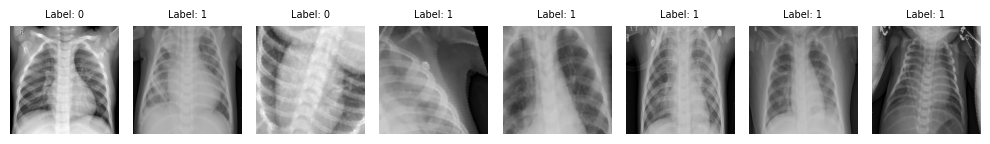

Sample 16: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 17: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 18: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 19: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 20: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 21: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 22: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 23: Label - 1, Image shape - torch.Size([3, 224, 224])


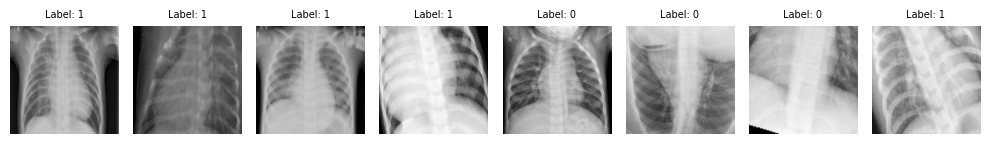

Sample 24: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 25: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 26: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 27: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 28: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 29: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 30: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 31: Label - 0, Image shape - torch.Size([3, 224, 224])


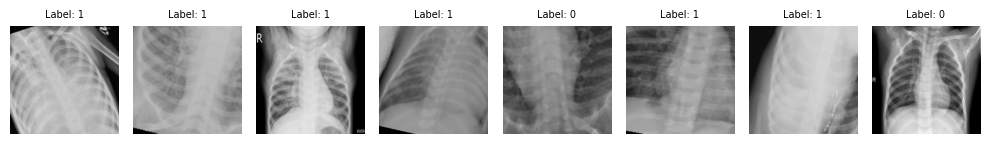

Sample 32: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 33: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 34: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 35: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 36: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 37: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 38: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 39: Label - 0, Image shape - torch.Size([3, 224, 224])


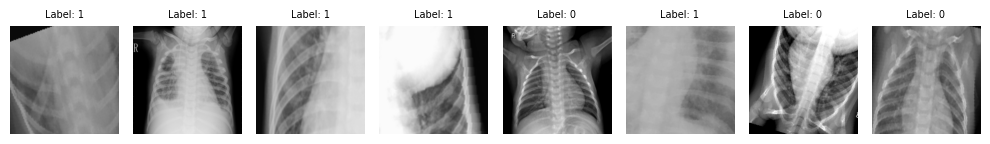

Sample 40: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 41: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 42: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 43: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 44: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 45: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 46: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 47: Label - 1, Image shape - torch.Size([3, 224, 224])


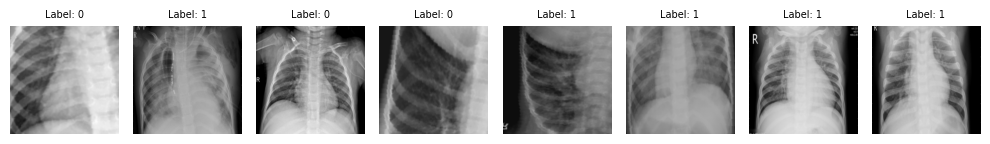

Sample 48: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 49: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 50: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 51: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 52: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 53: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 54: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 55: Label - 1, Image shape - torch.Size([3, 224, 224])


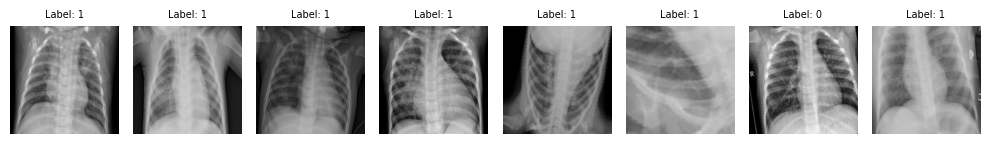

Sample 56: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 57: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 58: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 59: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 60: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 61: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 62: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 63: Label - 1, Image shape - torch.Size([3, 224, 224])


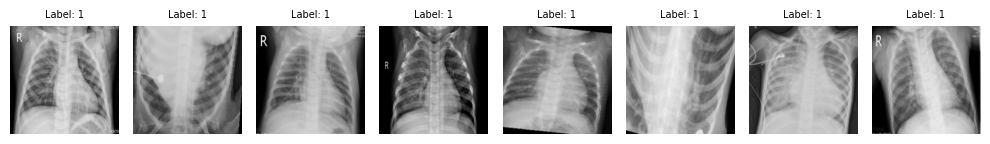

Sample 64: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 65: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 66: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 67: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 68: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 69: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 70: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 71: Label - 1, Image shape - torch.Size([3, 224, 224])


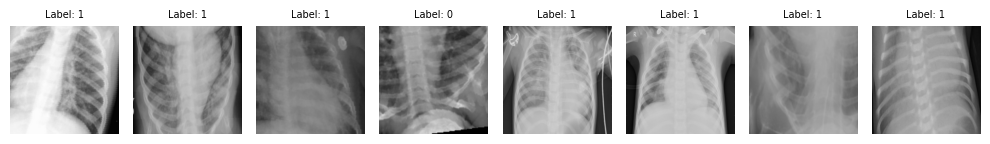

Sample 72: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 73: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 74: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 75: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 76: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 77: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 78: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 79: Label - 1, Image shape - torch.Size([3, 224, 224])


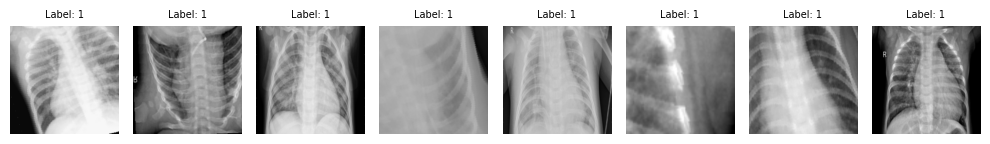

Sample 80: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 81: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 82: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 83: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 84: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 85: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 86: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 87: Label - 1, Image shape - torch.Size([3, 224, 224])


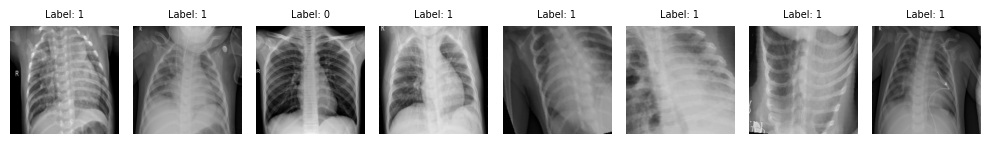

Sample 88: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 89: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 90: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 91: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 92: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 93: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 94: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 95: Label - 0, Image shape - torch.Size([3, 224, 224])


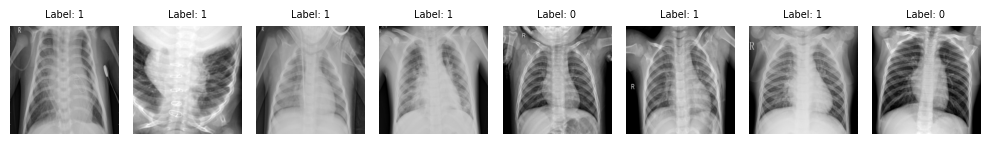

Sample 96: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 97: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 98: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 99: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 100: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 101: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 102: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 103: Label - 1, Image shape - torch.Size([3, 224, 224])


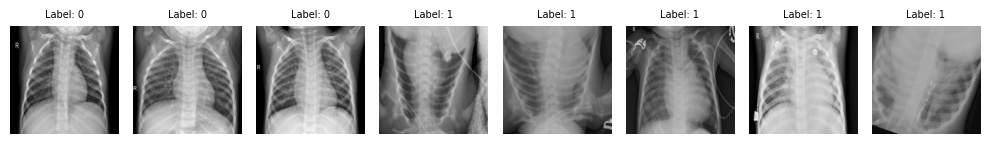

Sample 104: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 105: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 106: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 107: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 108: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 109: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 110: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 111: Label - 0, Image shape - torch.Size([3, 224, 224])


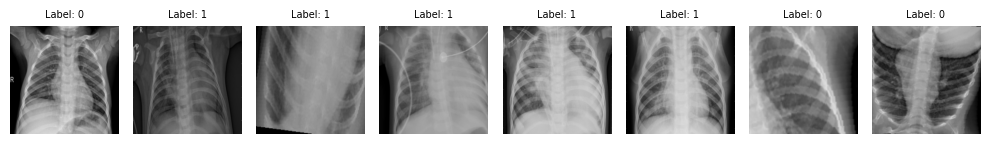

Sample 112: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 113: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 114: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 115: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 116: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 117: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 118: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 119: Label - 0, Image shape - torch.Size([3, 224, 224])


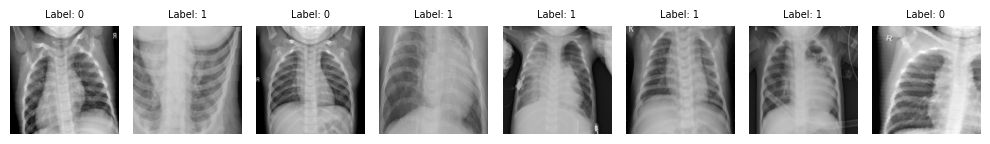

Sample 120: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 121: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 122: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 123: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 124: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 125: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 126: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 127: Label - 1, Image shape - torch.Size([3, 224, 224])


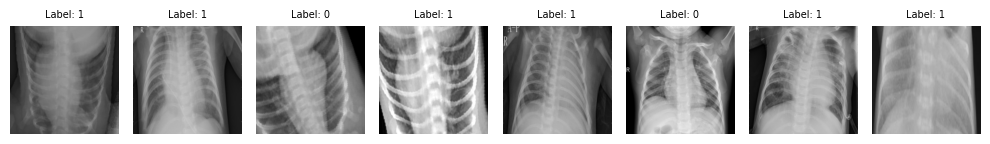

Sample 128: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 129: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 130: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 131: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 132: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 133: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 134: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 135: Label - 0, Image shape - torch.Size([3, 224, 224])


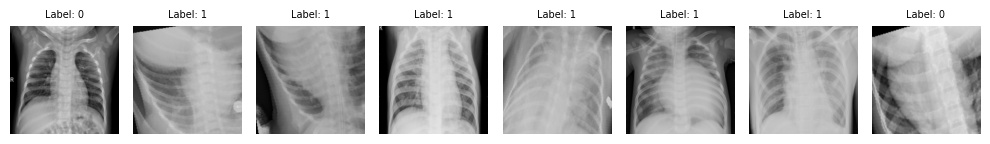

Sample 136: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 137: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 138: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 139: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 140: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 141: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 142: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 143: Label - 1, Image shape - torch.Size([3, 224, 224])


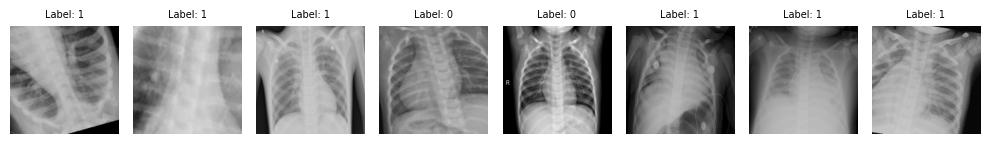

Sample 144: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 145: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 146: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 147: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 148: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 149: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 150: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 151: Label - 1, Image shape - torch.Size([3, 224, 224])


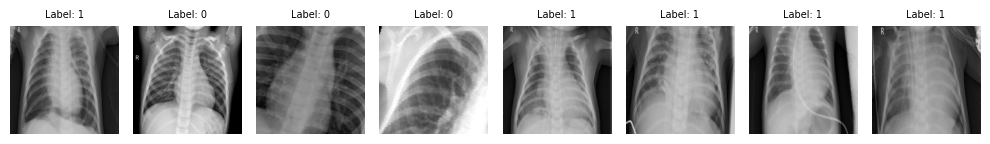

Sample 152: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 153: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 154: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 155: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 156: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 157: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 158: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 159: Label - 1, Image shape - torch.Size([3, 224, 224])


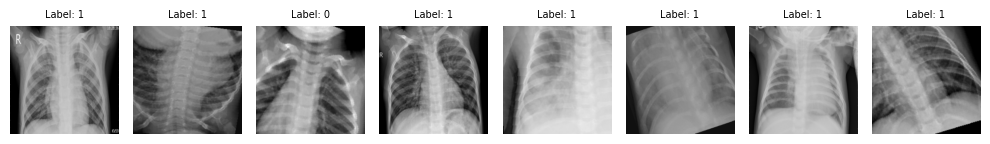

Sample 160: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 161: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 162: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 163: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 164: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 165: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 166: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 167: Label - 1, Image shape - torch.Size([3, 224, 224])


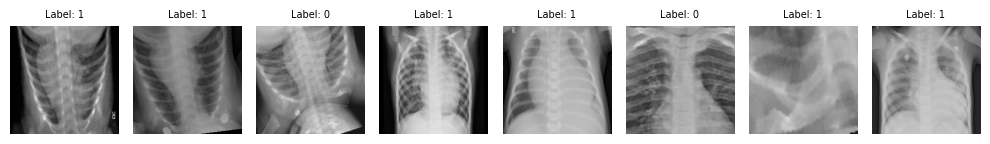

Sample 168: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 169: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 170: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 171: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 172: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 173: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 174: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 175: Label - 1, Image shape - torch.Size([3, 224, 224])


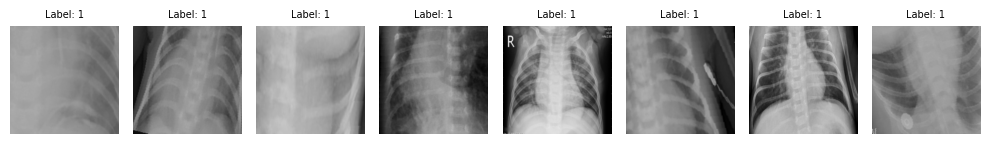

Sample 176: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 177: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 178: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 179: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 180: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 181: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 182: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 183: Label - 1, Image shape - torch.Size([3, 224, 224])


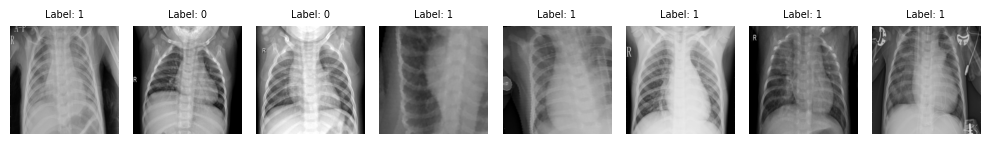

Sample 184: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 185: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 186: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 187: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 188: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 189: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 190: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 191: Label - 1, Image shape - torch.Size([3, 224, 224])


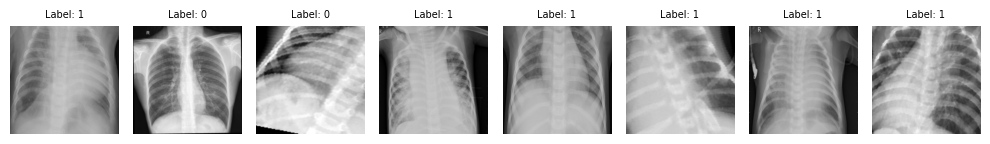

Sample 192: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 193: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 194: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 195: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 196: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 197: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 198: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 199: Label - 0, Image shape - torch.Size([3, 224, 224])


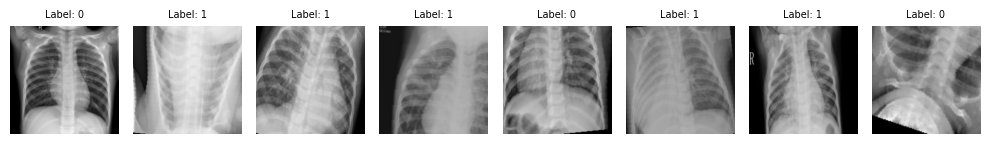

Sample 200: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 201: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 202: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 203: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 204: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 205: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 206: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 207: Label - 1, Image shape - torch.Size([3, 224, 224])


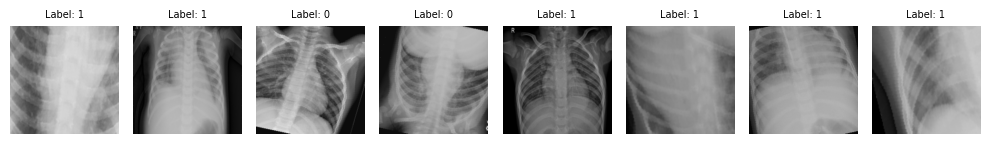

Sample 208: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 209: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 210: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 211: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 212: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 213: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 214: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 215: Label - 0, Image shape - torch.Size([3, 224, 224])


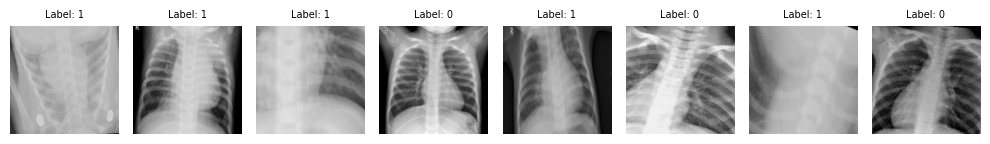

Sample 216: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 217: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 218: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 219: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 220: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 221: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 222: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 223: Label - 0, Image shape - torch.Size([3, 224, 224])


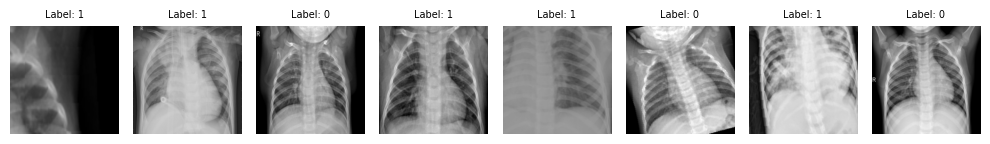

Sample 224: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 225: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 226: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 227: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 228: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 229: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 230: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 231: Label - 1, Image shape - torch.Size([3, 224, 224])


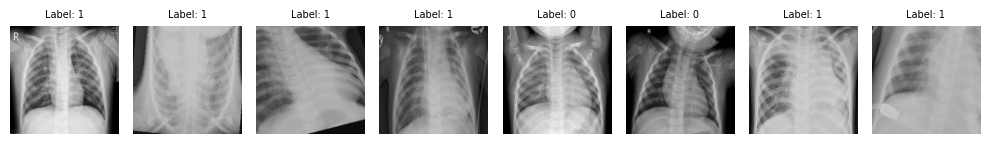

Sample 232: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 233: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 234: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 235: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 236: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 237: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 238: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 239: Label - 1, Image shape - torch.Size([3, 224, 224])


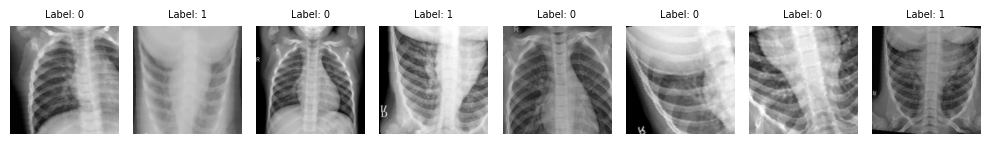

Sample 240: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 241: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 242: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 243: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 244: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 245: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 246: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 247: Label - 1, Image shape - torch.Size([3, 224, 224])


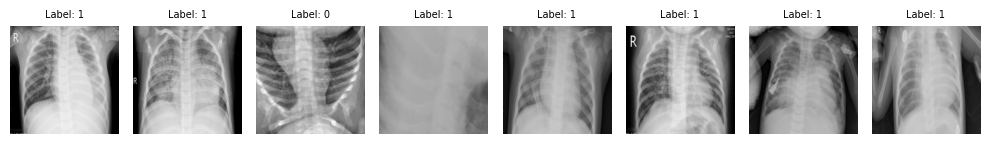

Sample 248: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 249: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 250: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 251: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 252: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 253: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 254: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 255: Label - 0, Image shape - torch.Size([3, 224, 224])


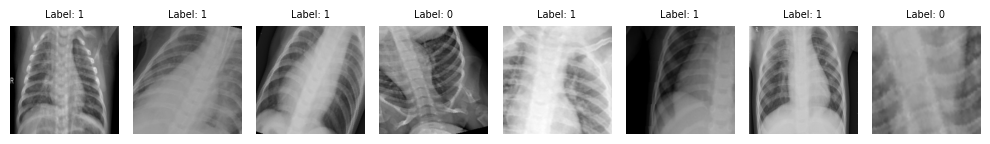

Sample 256: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 257: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 258: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 259: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 260: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 261: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 262: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 263: Label - 0, Image shape - torch.Size([3, 224, 224])


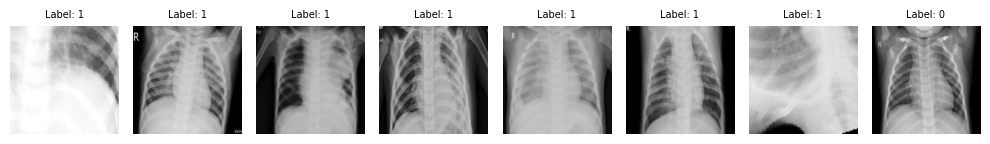

Sample 264: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 265: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 266: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 267: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 268: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 269: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 270: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 271: Label - 0, Image shape - torch.Size([3, 224, 224])


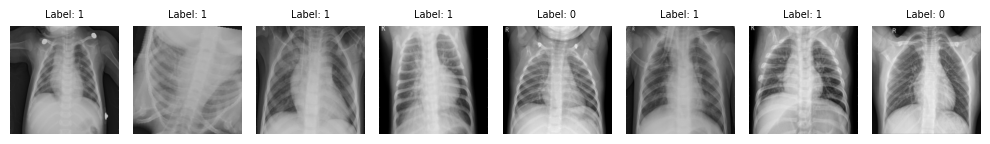

Sample 272: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 273: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 274: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 275: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 276: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 277: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 278: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 279: Label - 1, Image shape - torch.Size([3, 224, 224])


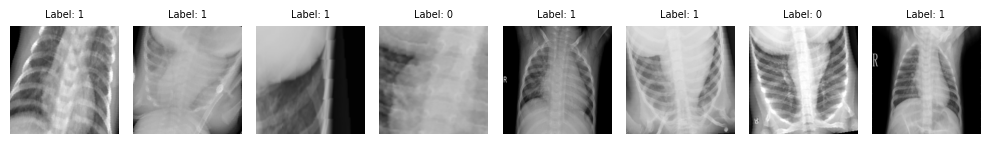

Sample 280: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 281: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 282: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 283: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 284: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 285: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 286: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 287: Label - 0, Image shape - torch.Size([3, 224, 224])


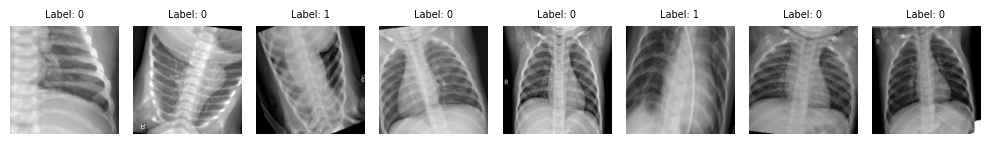

Sample 288: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 289: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 290: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 291: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 292: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 293: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 294: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 295: Label - 1, Image shape - torch.Size([3, 224, 224])


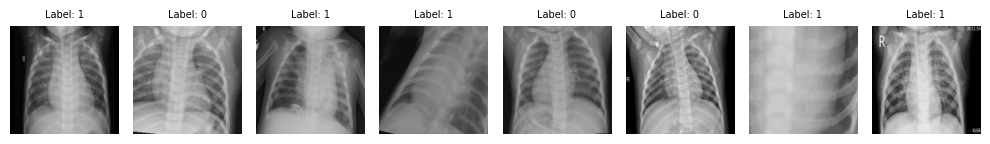

Sample 296: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 297: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 298: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 299: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 300: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 301: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 302: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 303: Label - 1, Image shape - torch.Size([3, 224, 224])


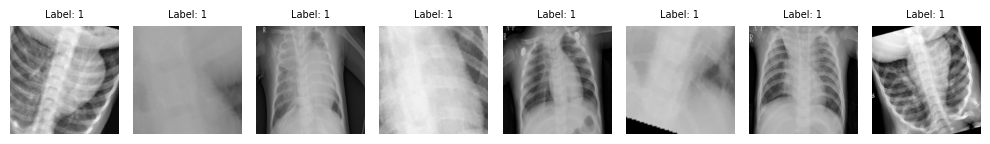

Sample 304: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 305: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 306: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 307: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 308: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 309: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 310: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 311: Label - 0, Image shape - torch.Size([3, 224, 224])


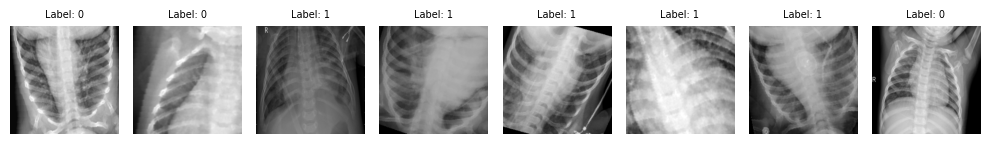

Sample 312: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 313: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 314: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 315: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 316: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 317: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 318: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 319: Label - 0, Image shape - torch.Size([3, 224, 224])


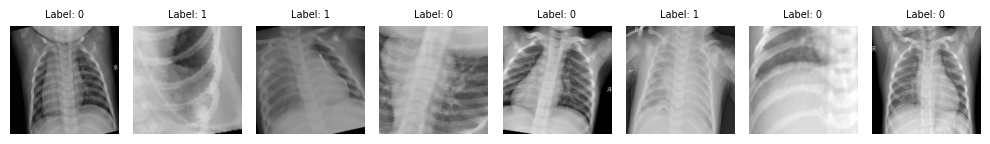

Sample 320: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 321: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 322: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 323: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 324: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 325: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 326: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 327: Label - 1, Image shape - torch.Size([3, 224, 224])


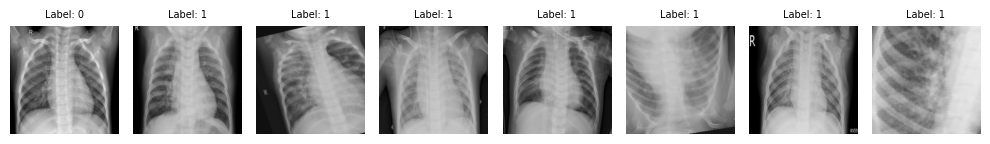

Sample 328: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 329: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 330: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 331: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 332: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 333: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 334: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 335: Label - 1, Image shape - torch.Size([3, 224, 224])


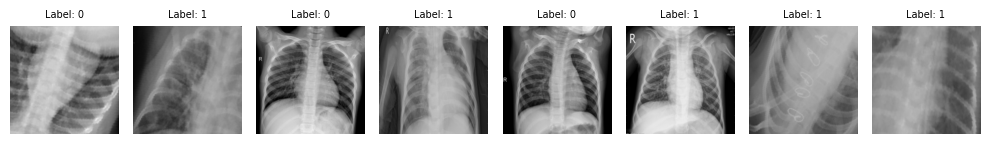

Sample 336: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 337: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 338: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 339: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 340: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 341: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 342: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 343: Label - 1, Image shape - torch.Size([3, 224, 224])


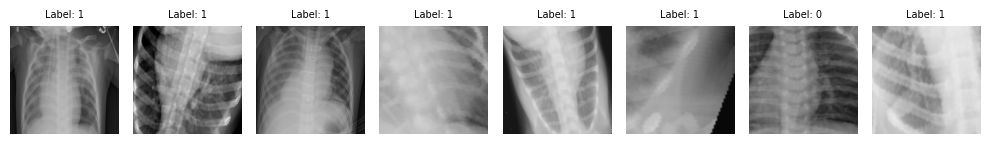

Sample 344: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 345: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 346: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 347: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 348: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 349: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 350: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 351: Label - 0, Image shape - torch.Size([3, 224, 224])


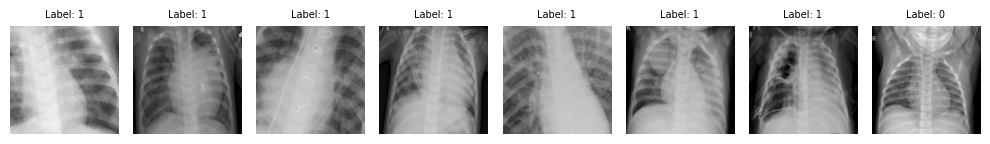

Sample 352: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 353: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 354: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 355: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 356: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 357: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 358: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 359: Label - 1, Image shape - torch.Size([3, 224, 224])


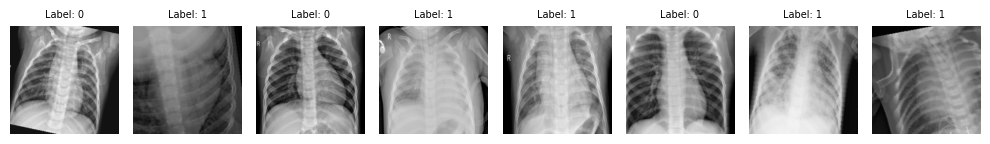

Sample 360: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 361: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 362: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 363: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 364: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 365: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 366: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 367: Label - 0, Image shape - torch.Size([3, 224, 224])


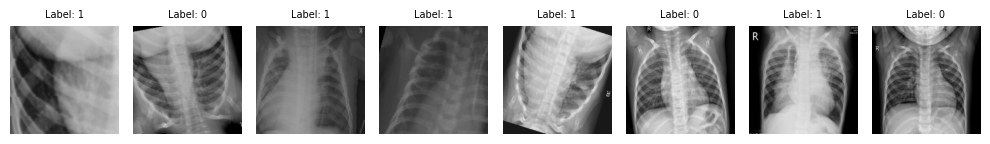

Sample 368: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 369: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 370: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 371: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 372: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 373: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 374: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 375: Label - 0, Image shape - torch.Size([3, 224, 224])


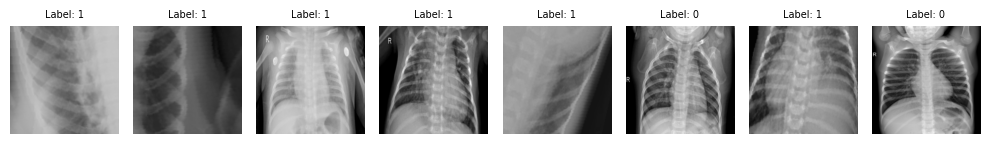

Sample 376: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 377: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 378: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 379: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 380: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 381: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 382: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 383: Label - 1, Image shape - torch.Size([3, 224, 224])


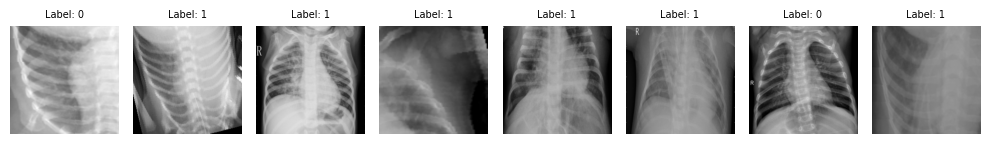

Sample 384: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 385: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 386: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 387: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 388: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 389: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 390: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 391: Label - 1, Image shape - torch.Size([3, 224, 224])


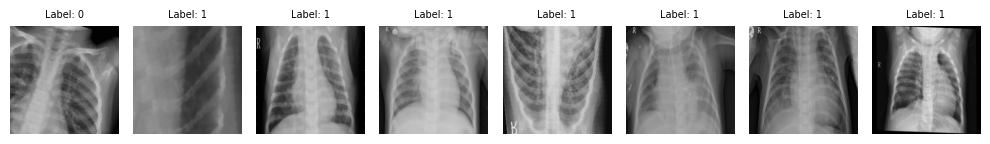

Sample 392: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 393: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 394: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 395: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 396: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 397: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 398: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 399: Label - 0, Image shape - torch.Size([3, 224, 224])


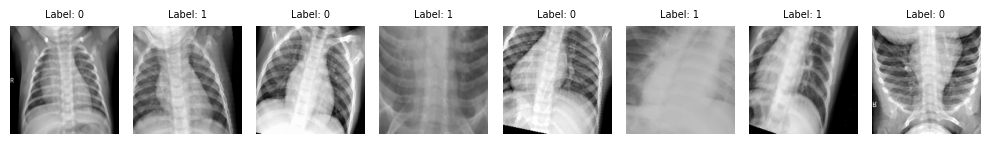

Sample 400: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 401: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 402: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 403: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 404: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 405: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 406: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 407: Label - 1, Image shape - torch.Size([3, 224, 224])


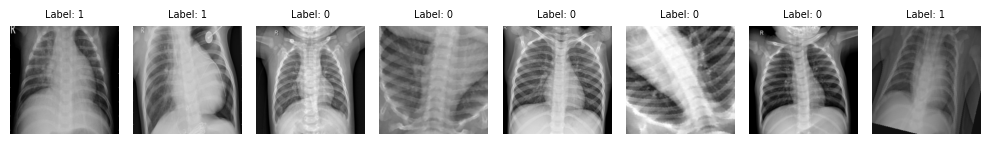

Sample 408: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 409: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 410: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 411: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 412: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 413: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 414: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 415: Label - 1, Image shape - torch.Size([3, 224, 224])


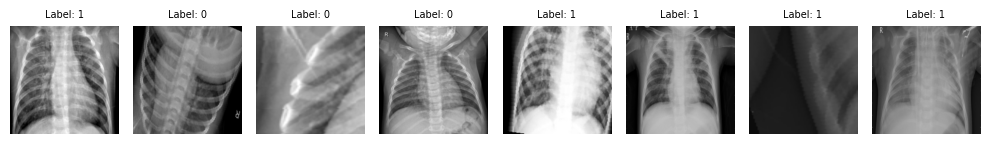

Sample 416: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 417: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 418: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 419: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 420: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 421: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 422: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 423: Label - 1, Image shape - torch.Size([3, 224, 224])


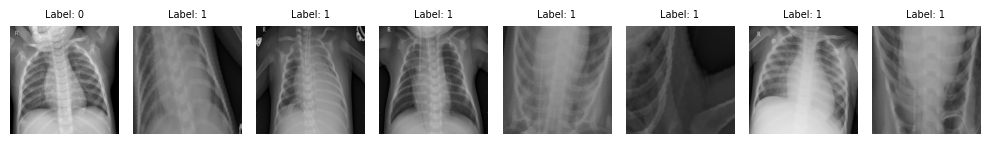

Sample 424: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 425: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 426: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 427: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 428: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 429: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 430: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 431: Label - 0, Image shape - torch.Size([3, 224, 224])


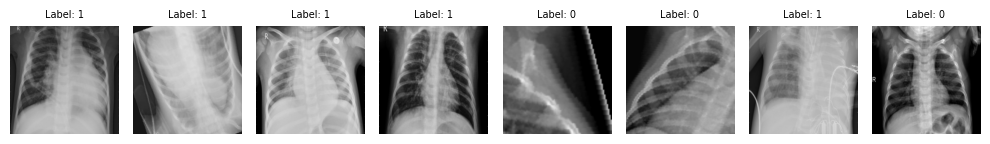

Sample 432: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 433: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 434: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 435: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 436: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 437: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 438: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 439: Label - 1, Image shape - torch.Size([3, 224, 224])


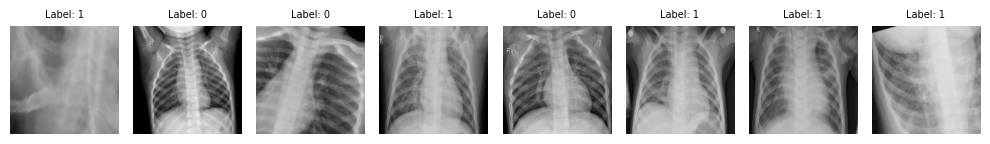

Sample 440: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 441: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 442: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 443: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 444: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 445: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 446: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 447: Label - 1, Image shape - torch.Size([3, 224, 224])


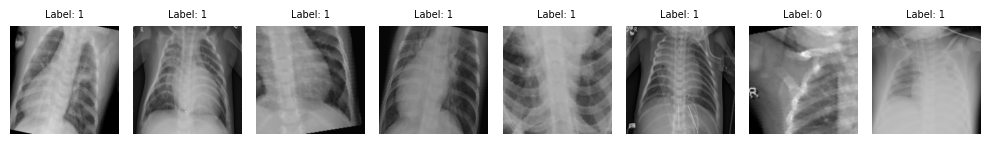

Sample 448: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 449: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 450: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 451: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 452: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 453: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 454: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 455: Label - 1, Image shape - torch.Size([3, 224, 224])


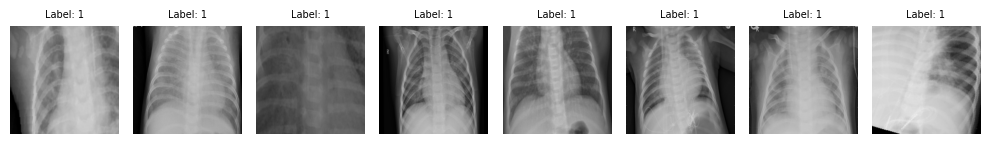

Sample 456: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 457: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 458: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 459: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 460: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 461: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 462: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 463: Label - 1, Image shape - torch.Size([3, 224, 224])


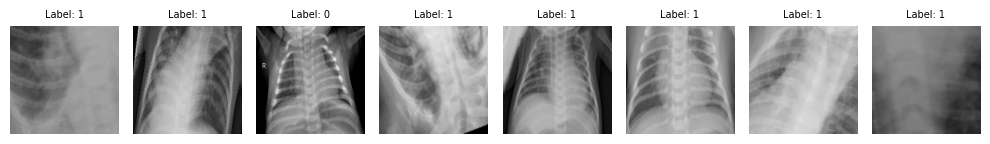

Sample 464: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 465: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 466: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 467: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 468: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 469: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 470: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 471: Label - 1, Image shape - torch.Size([3, 224, 224])


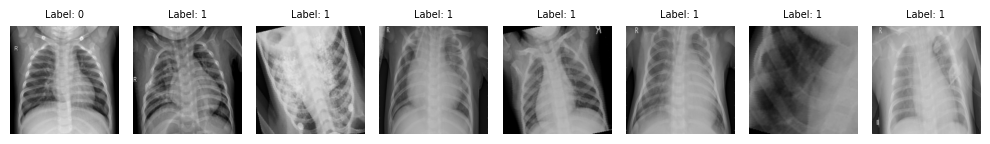

Sample 472: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 473: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 474: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 475: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 476: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 477: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 478: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 479: Label - 1, Image shape - torch.Size([3, 224, 224])


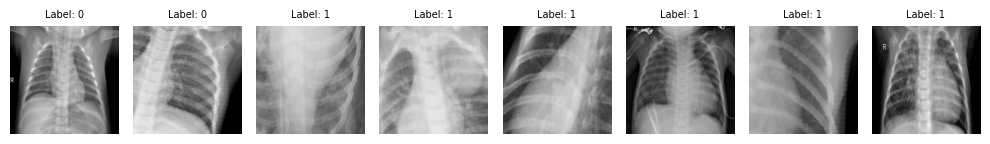

Sample 480: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 481: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 482: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 483: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 484: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 485: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 486: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 487: Label - 1, Image shape - torch.Size([3, 224, 224])


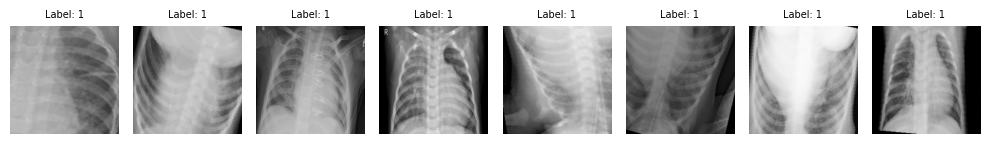

Sample 488: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 489: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 490: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 491: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 492: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 493: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 494: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 495: Label - 1, Image shape - torch.Size([3, 224, 224])


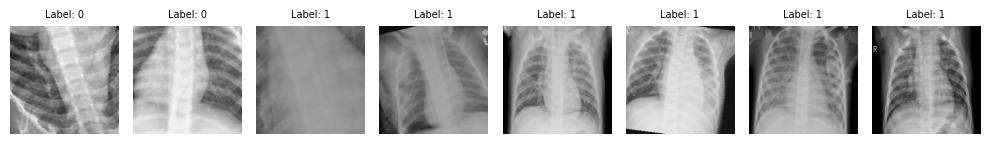

Sample 496: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 497: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 498: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 499: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 500: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 501: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 502: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 503: Label - 0, Image shape - torch.Size([3, 224, 224])


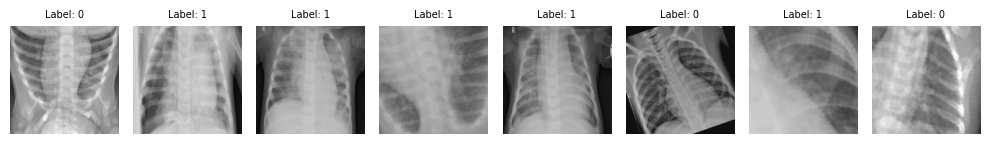

Sample 504: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 505: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 506: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 507: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 508: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 509: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 510: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 511: Label - 1, Image shape - torch.Size([3, 224, 224])


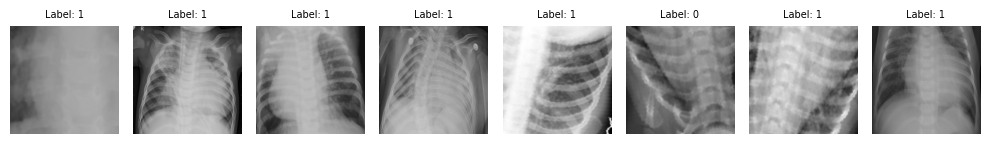

Sample 512: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 513: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 514: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 515: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 516: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 517: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 518: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 519: Label - 1, Image shape - torch.Size([3, 224, 224])


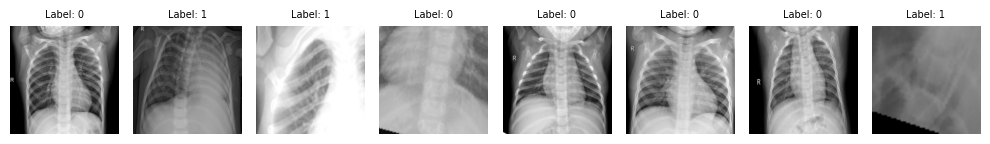

Sample 520: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 521: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 522: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 523: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 524: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 525: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 526: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 527: Label - 1, Image shape - torch.Size([3, 224, 224])


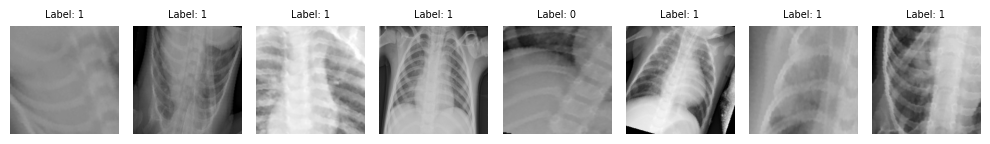

Sample 528: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 529: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 530: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 531: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 532: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 533: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 534: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 535: Label - 1, Image shape - torch.Size([3, 224, 224])


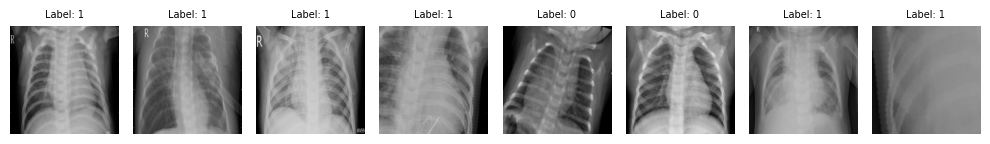

Sample 536: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 537: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 538: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 539: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 540: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 541: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 542: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 543: Label - 1, Image shape - torch.Size([3, 224, 224])


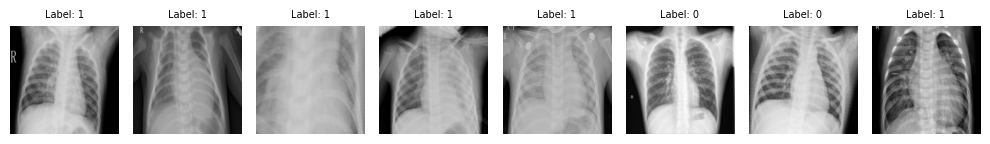

Sample 544: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 545: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 546: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 547: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 548: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 549: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 550: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 551: Label - 0, Image shape - torch.Size([3, 224, 224])


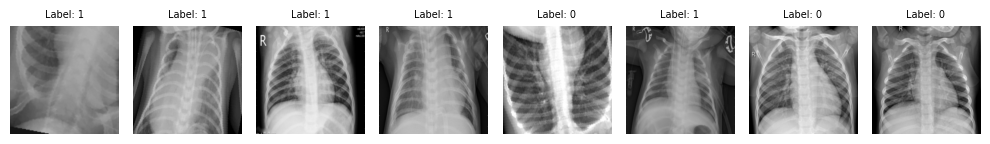

Sample 552: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 553: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 554: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 555: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 556: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 557: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 558: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 559: Label - 1, Image shape - torch.Size([3, 224, 224])


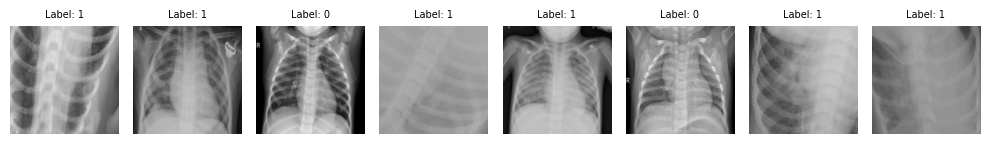

Sample 560: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 561: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 562: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 563: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 564: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 565: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 566: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 567: Label - 1, Image shape - torch.Size([3, 224, 224])


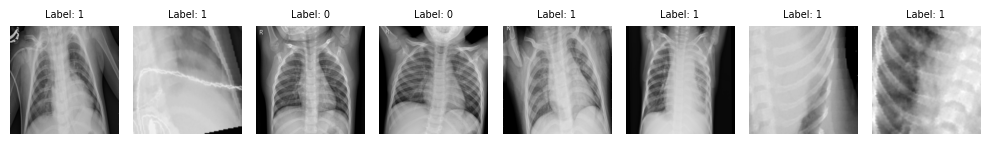

Sample 568: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 569: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 570: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 571: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 572: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 573: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 574: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 575: Label - 1, Image shape - torch.Size([3, 224, 224])


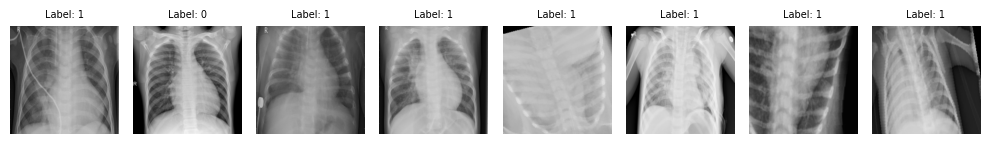

Sample 576: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 577: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 578: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 579: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 580: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 581: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 582: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 583: Label - 1, Image shape - torch.Size([3, 224, 224])


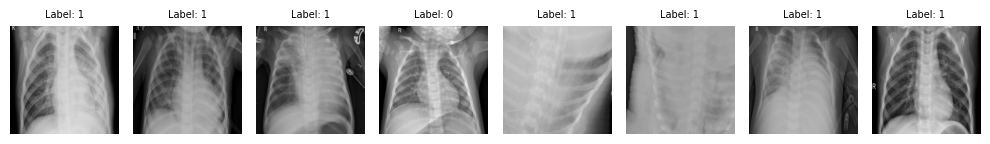

Sample 584: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 585: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 586: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 587: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 588: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 589: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 590: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 591: Label - 1, Image shape - torch.Size([3, 224, 224])


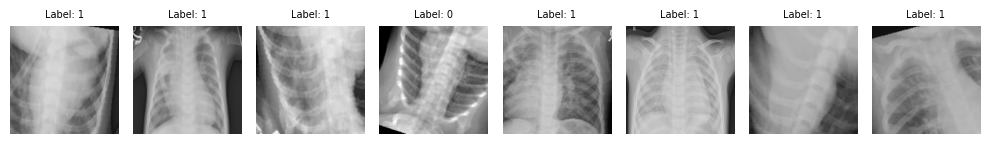

Sample 592: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 593: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 594: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 595: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 596: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 597: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 598: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 599: Label - 1, Image shape - torch.Size([3, 224, 224])


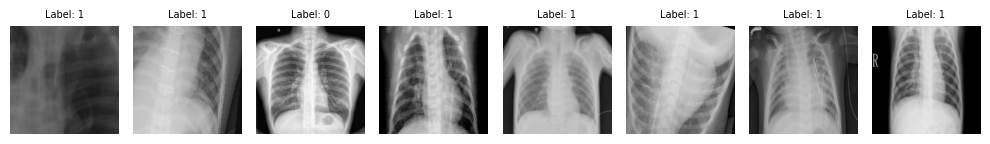

Sample 600: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 601: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 602: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 603: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 604: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 605: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 606: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 607: Label - 1, Image shape - torch.Size([3, 224, 224])


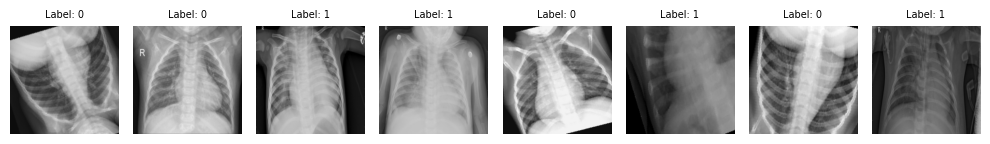

Sample 608: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 609: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 610: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 611: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 612: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 613: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 614: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 615: Label - 1, Image shape - torch.Size([3, 224, 224])


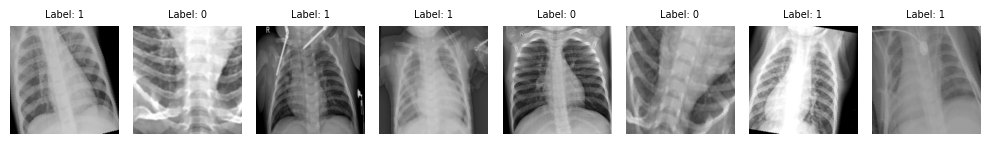

Sample 616: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 617: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 618: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 619: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 620: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 621: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 622: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 623: Label - 1, Image shape - torch.Size([3, 224, 224])


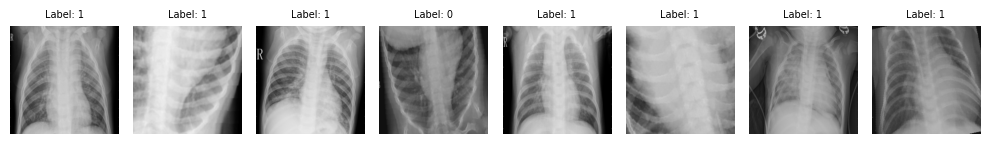

Sample 624: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 625: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 626: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 627: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 628: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 629: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 630: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 631: Label - 1, Image shape - torch.Size([3, 224, 224])


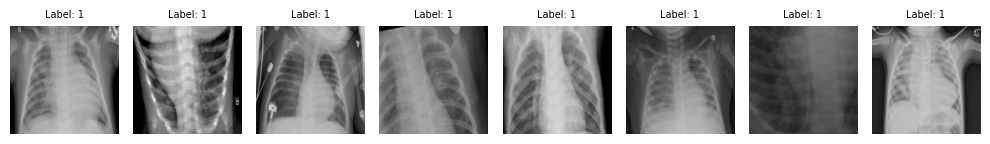

Sample 632: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 633: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 634: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 635: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 636: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 637: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 638: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 639: Label - 0, Image shape - torch.Size([3, 224, 224])


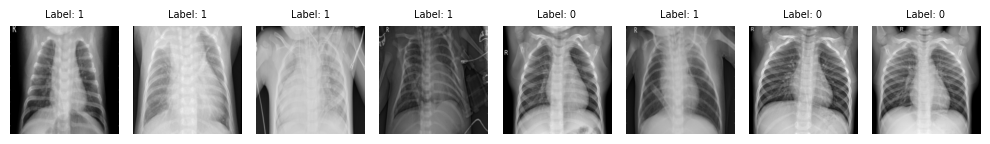

Sample 640: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 641: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 642: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 643: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 644: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 645: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 646: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 647: Label - 1, Image shape - torch.Size([3, 224, 224])


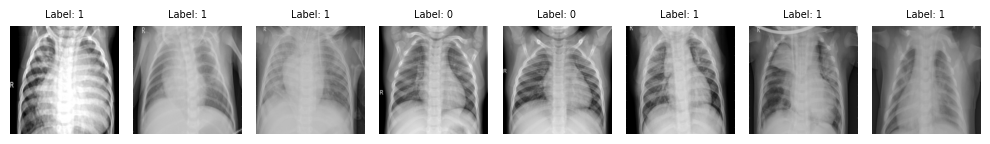

Sample 648: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 649: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 650: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 651: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 652: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 653: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 654: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 655: Label - 1, Image shape - torch.Size([3, 224, 224])


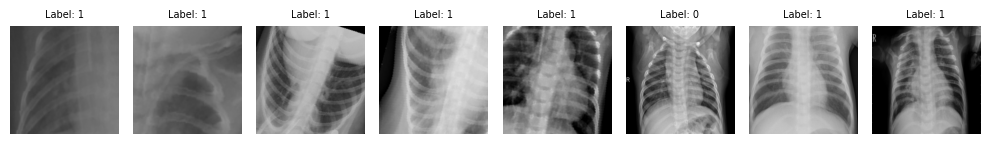

Sample 656: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 657: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 658: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 659: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 660: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 661: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 662: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 663: Label - 0, Image shape - torch.Size([3, 224, 224])


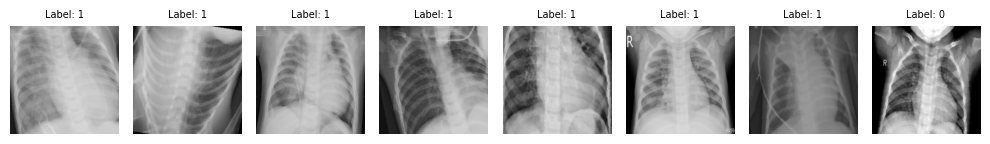

Sample 664: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 665: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 666: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 667: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 668: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 669: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 670: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 671: Label - 1, Image shape - torch.Size([3, 224, 224])


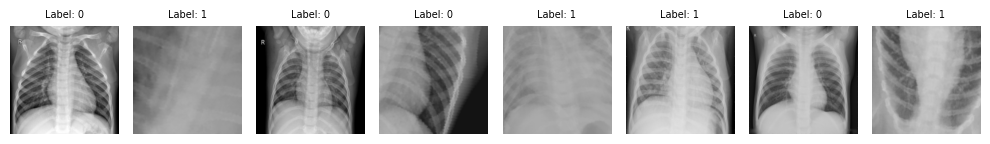

Sample 672: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 673: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 674: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 675: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 676: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 677: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 678: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 679: Label - 1, Image shape - torch.Size([3, 224, 224])


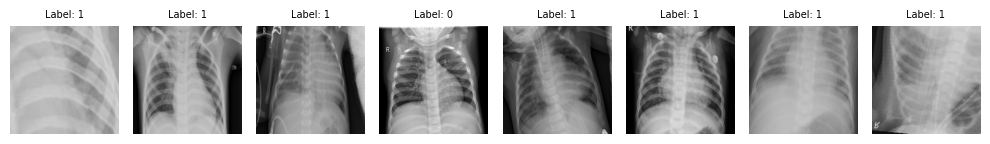

Sample 680: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 681: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 682: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 683: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 684: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 685: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 686: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 687: Label - 1, Image shape - torch.Size([3, 224, 224])


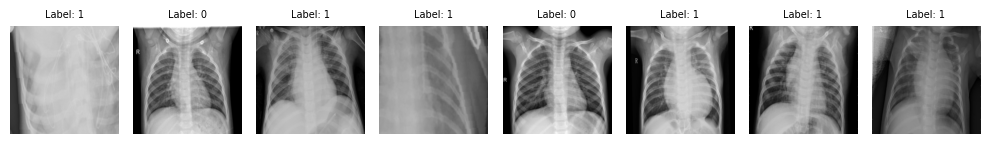

Sample 688: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 689: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 690: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 691: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 692: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 693: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 694: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 695: Label - 0, Image shape - torch.Size([3, 224, 224])


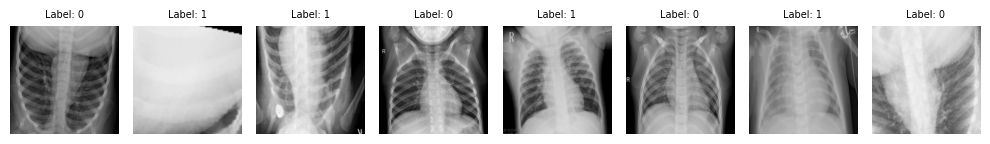

Sample 696: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 697: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 698: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 699: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 700: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 701: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 702: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 703: Label - 0, Image shape - torch.Size([3, 224, 224])


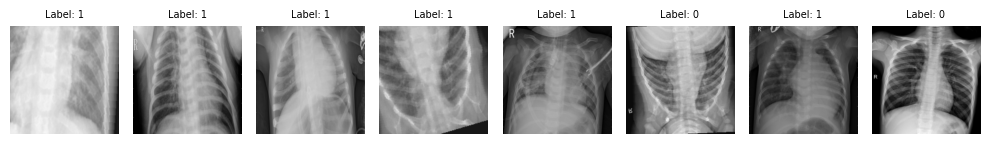

Sample 704: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 705: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 706: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 707: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 708: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 709: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 710: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 711: Label - 0, Image shape - torch.Size([3, 224, 224])


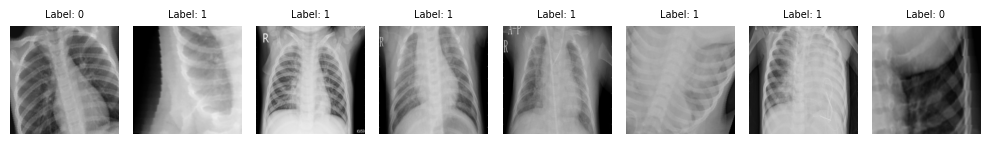

Sample 712: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 713: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 714: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 715: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 716: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 717: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 718: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 719: Label - 0, Image shape - torch.Size([3, 224, 224])


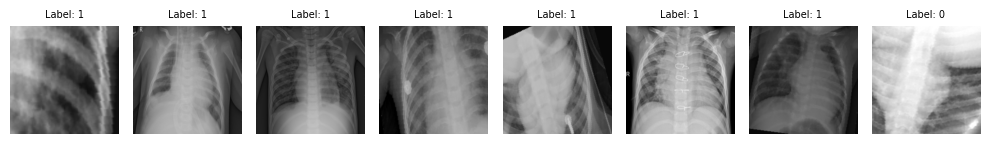

Sample 720: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 721: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 722: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 723: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 724: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 725: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 726: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 727: Label - 0, Image shape - torch.Size([3, 224, 224])


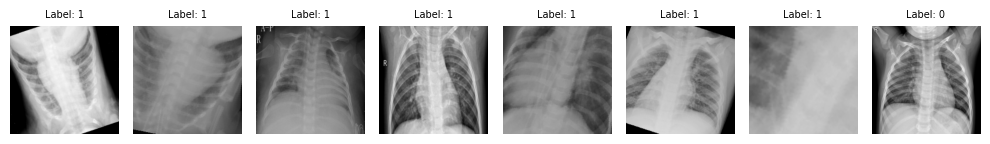

Sample 728: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 729: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 730: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 731: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 732: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 733: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 734: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 735: Label - 1, Image shape - torch.Size([3, 224, 224])


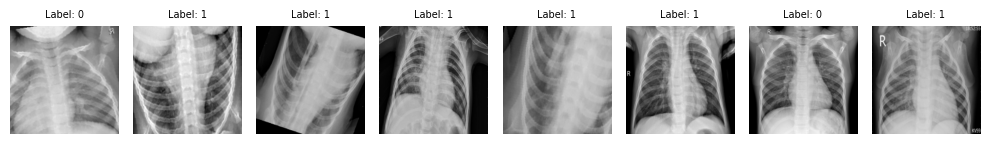

Sample 736: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 737: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 738: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 739: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 740: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 741: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 742: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 743: Label - 1, Image shape - torch.Size([3, 224, 224])


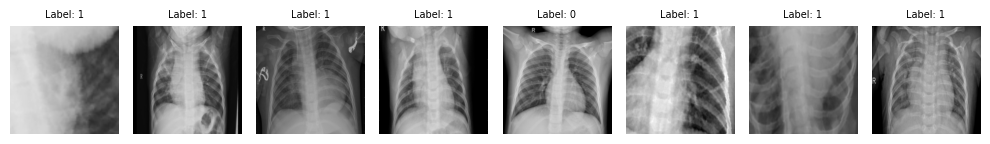

Sample 744: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 745: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 746: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 747: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 748: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 749: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 750: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 751: Label - 1, Image shape - torch.Size([3, 224, 224])


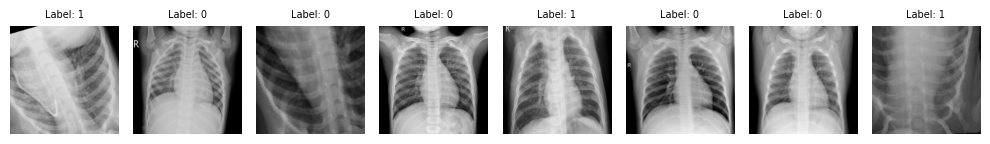

Sample 752: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 753: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 754: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 755: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 756: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 757: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 758: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 759: Label - 1, Image shape - torch.Size([3, 224, 224])


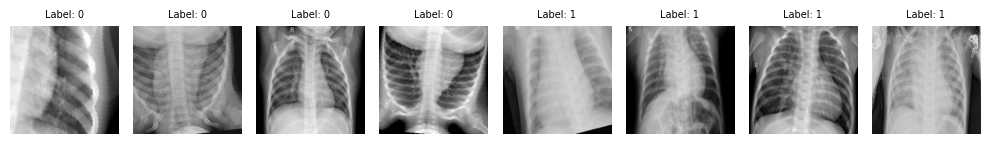

Sample 760: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 761: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 762: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 763: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 764: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 765: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 766: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 767: Label - 1, Image shape - torch.Size([3, 224, 224])


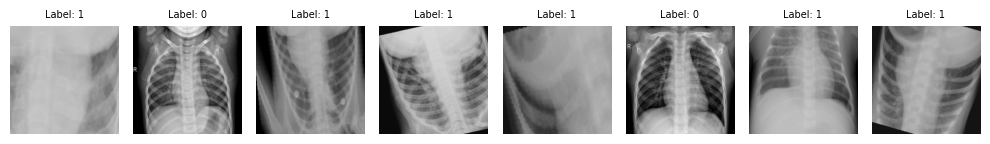

Sample 768: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 769: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 770: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 771: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 772: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 773: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 774: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 775: Label - 1, Image shape - torch.Size([3, 224, 224])


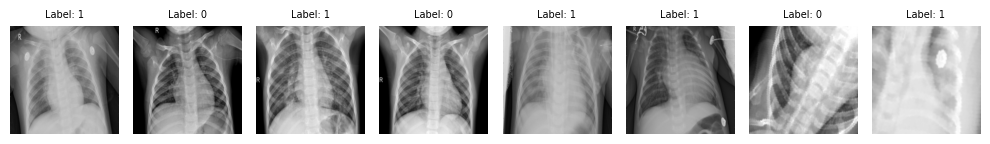

Sample 776: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 777: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 778: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 779: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 780: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 781: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 782: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 783: Label - 1, Image shape - torch.Size([3, 224, 224])


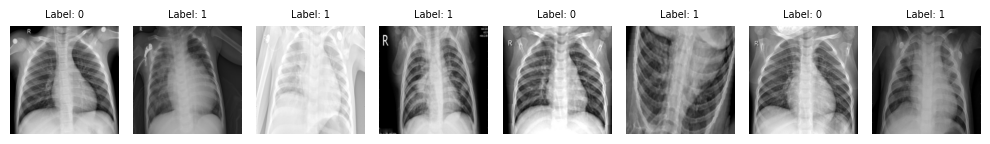

Sample 784: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 785: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 786: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 787: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 788: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 789: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 790: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 791: Label - 1, Image shape - torch.Size([3, 224, 224])


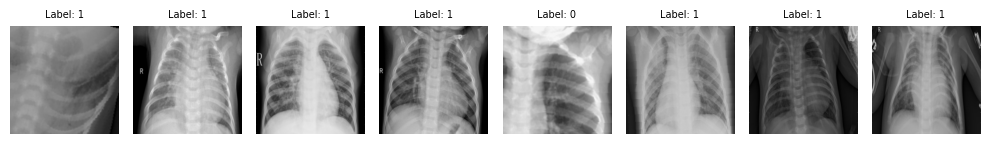

Sample 792: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 793: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 794: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 795: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 796: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 797: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 798: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 799: Label - 0, Image shape - torch.Size([3, 224, 224])


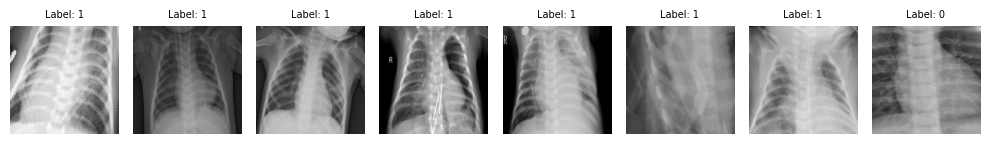

Sample 800: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 801: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 802: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 803: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 804: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 805: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 806: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 807: Label - 1, Image shape - torch.Size([3, 224, 224])


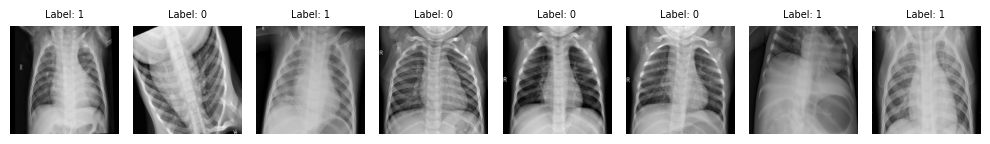

Sample 808: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 809: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 810: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 811: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 812: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 813: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 814: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 815: Label - 0, Image shape - torch.Size([3, 224, 224])


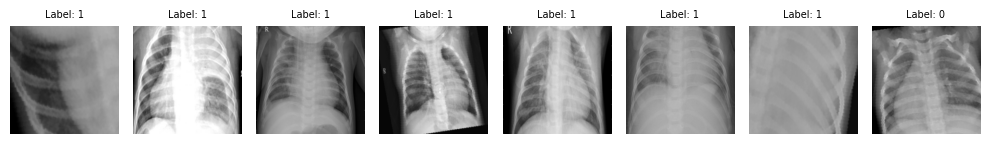

Sample 816: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 817: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 818: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 819: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 820: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 821: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 822: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 823: Label - 1, Image shape - torch.Size([3, 224, 224])


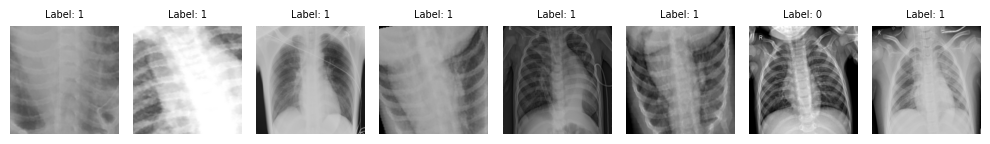

Sample 824: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 825: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 826: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 827: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 828: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 829: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 830: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 831: Label - 1, Image shape - torch.Size([3, 224, 224])


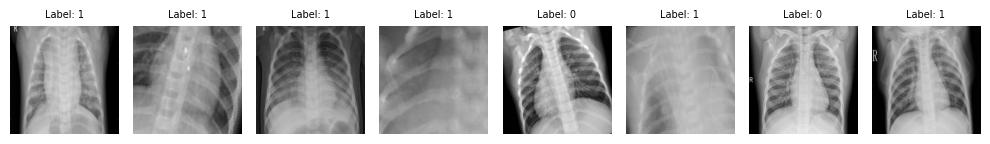

Sample 832: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 833: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 834: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 835: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 836: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 837: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 838: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 839: Label - 1, Image shape - torch.Size([3, 224, 224])


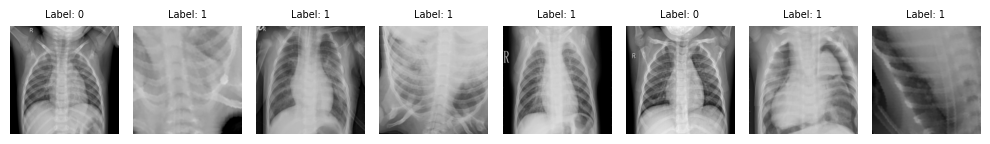

Sample 840: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 841: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 842: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 843: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 844: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 845: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 846: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 847: Label - 0, Image shape - torch.Size([3, 224, 224])


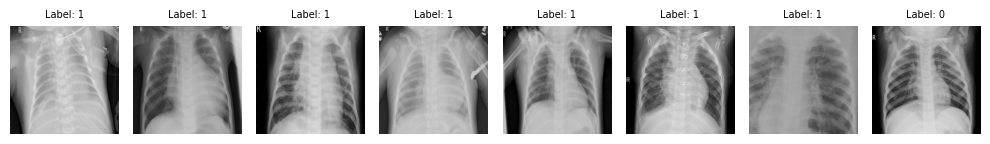

Sample 848: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 849: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 850: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 851: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 852: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 853: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 854: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 855: Label - 1, Image shape - torch.Size([3, 224, 224])


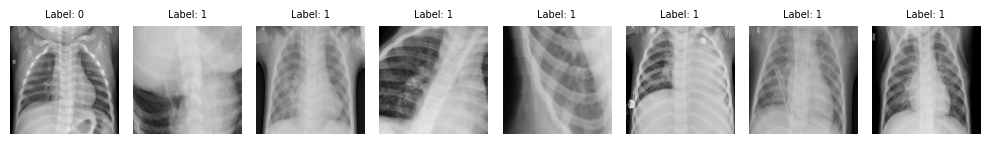

Sample 856: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 857: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 858: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 859: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 860: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 861: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 862: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 863: Label - 1, Image shape - torch.Size([3, 224, 224])


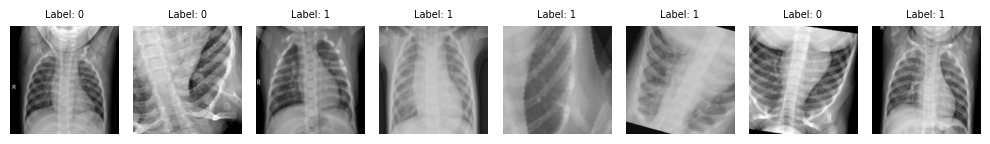

Sample 864: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 865: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 866: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 867: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 868: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 869: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 870: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 871: Label - 1, Image shape - torch.Size([3, 224, 224])


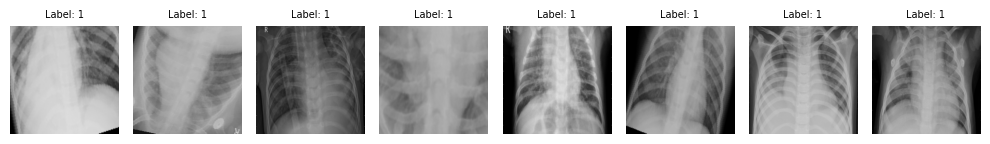

Sample 872: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 873: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 874: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 875: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 876: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 877: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 878: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 879: Label - 1, Image shape - torch.Size([3, 224, 224])


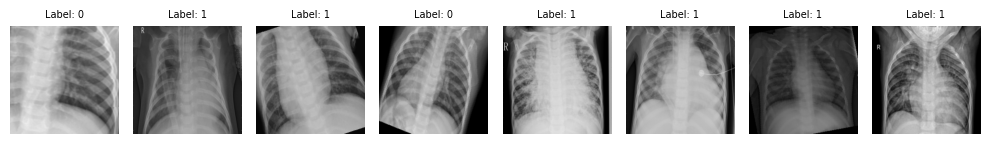

Sample 880: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 881: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 882: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 883: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 884: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 885: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 886: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 887: Label - 1, Image shape - torch.Size([3, 224, 224])


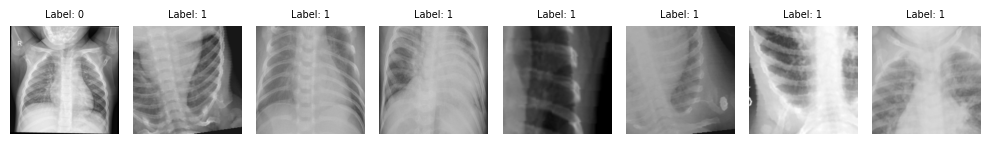

Sample 888: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 889: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 890: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 891: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 892: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 893: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 894: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 895: Label - 1, Image shape - torch.Size([3, 224, 224])


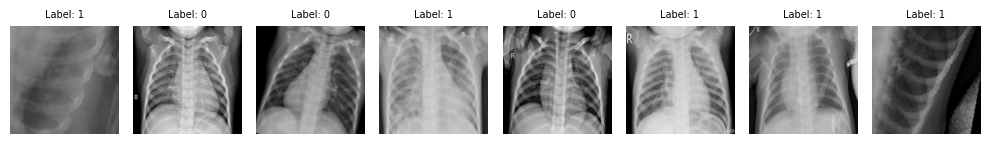

Sample 896: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 897: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 898: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 899: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 900: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 901: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 902: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 903: Label - 1, Image shape - torch.Size([3, 224, 224])


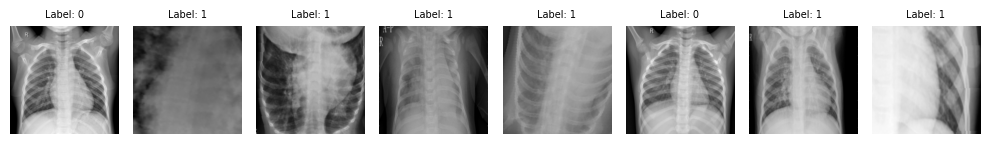

Sample 904: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 905: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 906: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 907: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 908: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 909: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 910: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 911: Label - 1, Image shape - torch.Size([3, 224, 224])


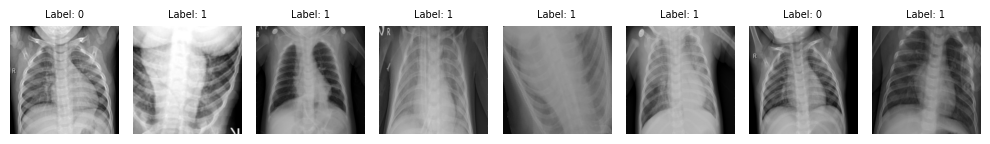

Sample 912: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 913: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 914: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 915: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 916: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 917: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 918: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 919: Label - 1, Image shape - torch.Size([3, 224, 224])


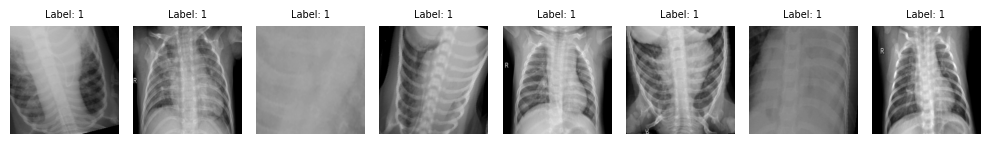

Sample 920: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 921: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 922: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 923: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 924: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 925: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 926: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 927: Label - 1, Image shape - torch.Size([3, 224, 224])


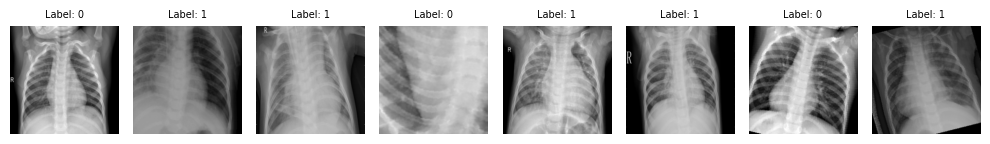

Sample 928: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 929: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 930: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 931: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 932: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 933: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 934: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 935: Label - 1, Image shape - torch.Size([3, 224, 224])


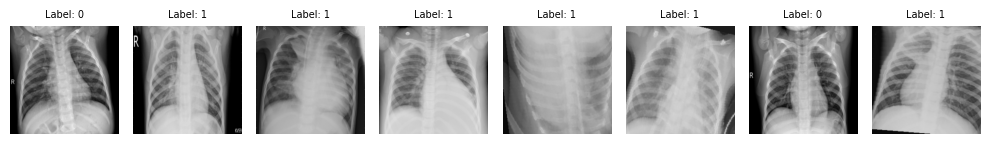

Sample 936: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 937: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 938: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 939: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 940: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 941: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 942: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 943: Label - 0, Image shape - torch.Size([3, 224, 224])


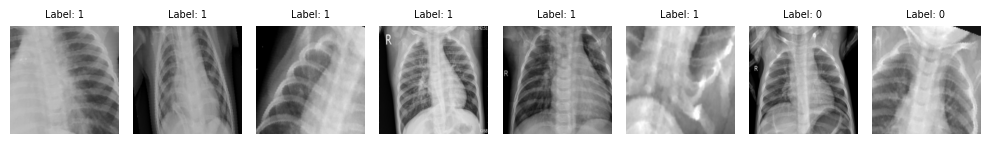

Sample 944: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 945: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 946: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 947: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 948: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 949: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 950: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 951: Label - 1, Image shape - torch.Size([3, 224, 224])


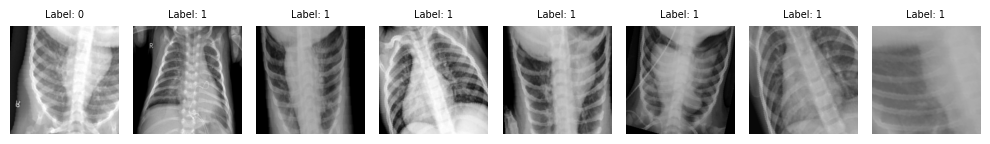

Sample 952: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 953: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 954: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 955: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 956: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 957: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 958: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 959: Label - 0, Image shape - torch.Size([3, 224, 224])


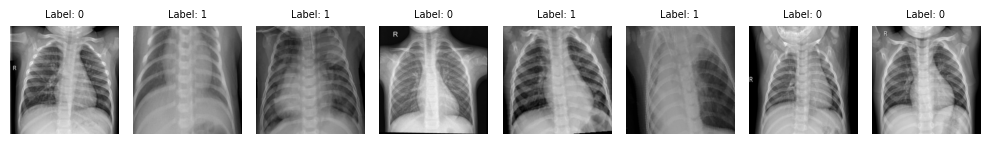

Sample 960: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 961: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 962: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 963: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 964: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 965: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 966: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 967: Label - 1, Image shape - torch.Size([3, 224, 224])


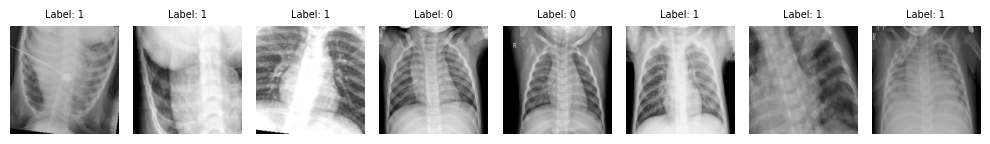

Sample 968: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 969: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 970: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 971: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 972: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 973: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 974: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 975: Label - 0, Image shape - torch.Size([3, 224, 224])


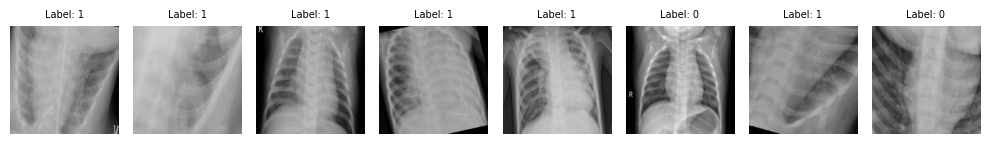

Sample 976: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 977: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 978: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 979: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 980: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 981: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 982: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 983: Label - 1, Image shape - torch.Size([3, 224, 224])


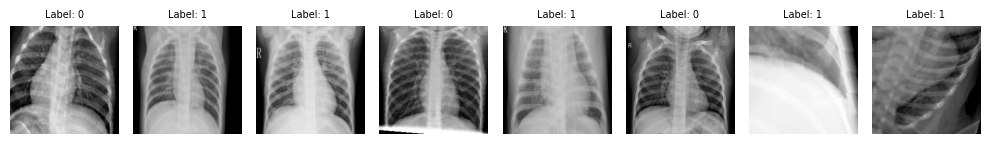

Sample 984: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 985: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 986: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 987: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 988: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 989: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 990: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 991: Label - 1, Image shape - torch.Size([3, 224, 224])


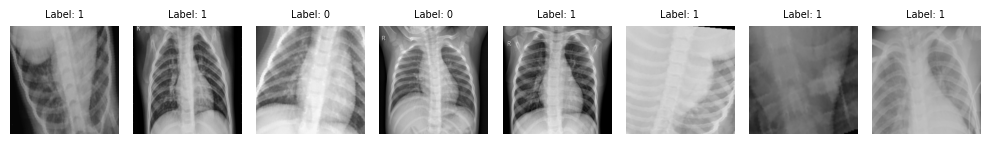

Sample 992: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 993: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 994: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 995: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 996: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 997: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 998: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 999: Label - 1, Image shape - torch.Size([3, 224, 224])


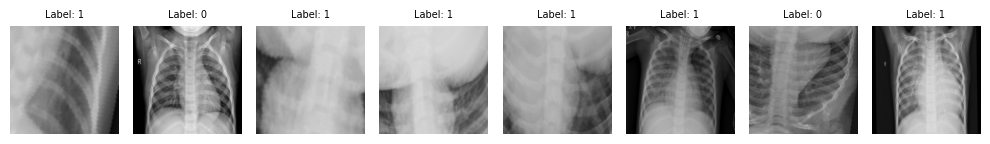

Sample 1000: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1001: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1002: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1003: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1004: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1005: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1006: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1007: Label - 1, Image shape - torch.Size([3, 224, 224])


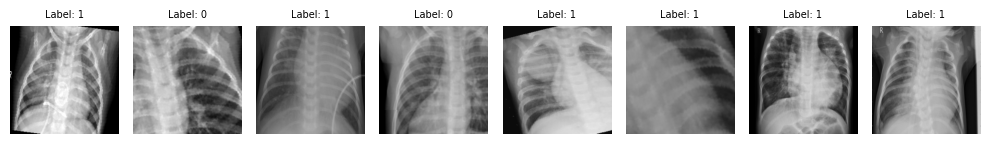

Sample 1008: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1009: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1010: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1011: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1012: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1013: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1014: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1015: Label - 0, Image shape - torch.Size([3, 224, 224])


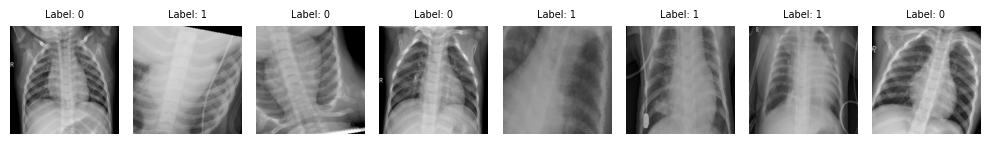

Sample 1016: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1017: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1018: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1019: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1020: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1021: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1022: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1023: Label - 1, Image shape - torch.Size([3, 224, 224])


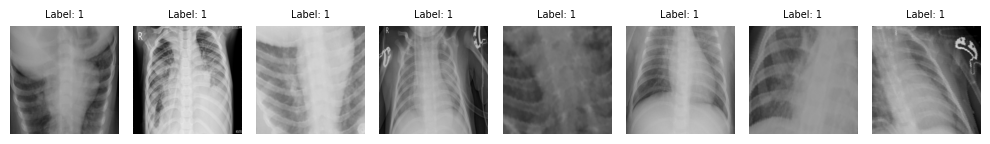

Sample 1024: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1025: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1026: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1027: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1028: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1029: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1030: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1031: Label - 1, Image shape - torch.Size([3, 224, 224])


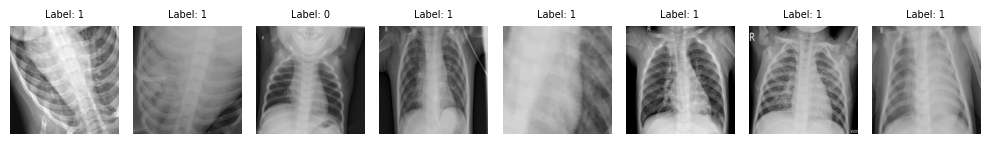

Sample 1032: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1033: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1034: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1035: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1036: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1037: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1038: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1039: Label - 1, Image shape - torch.Size([3, 224, 224])


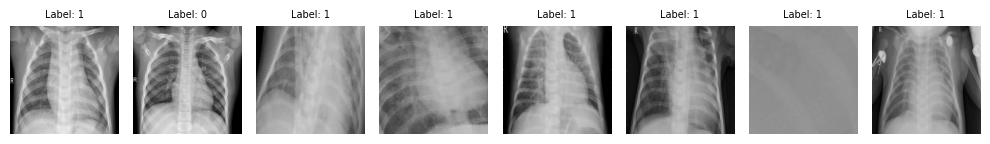

Sample 1040: Label - 1, Image shape - torch.Size([3, 224, 224])
Sample 1041: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1042: Label - 0, Image shape - torch.Size([3, 224, 224])
Sample 1043: Label - 1, Image shape - torch.Size([3, 224, 224])


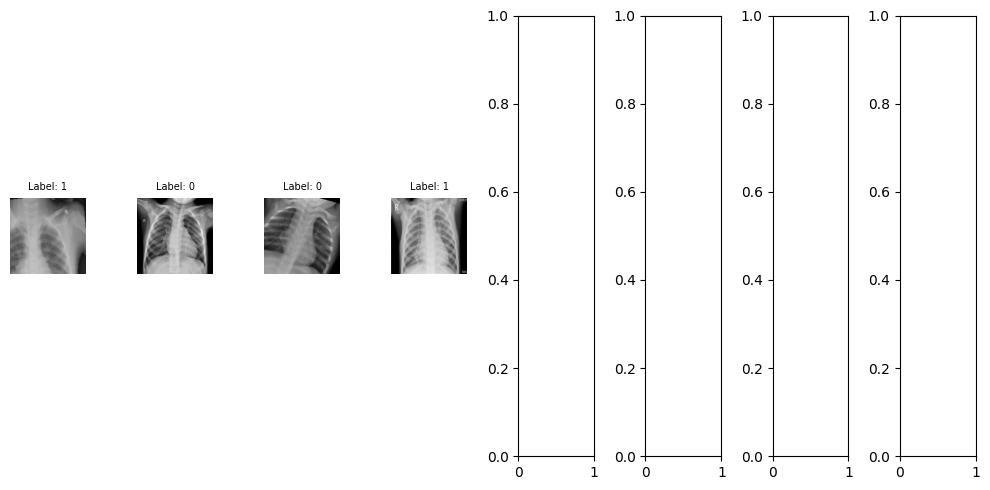

In [ ]:
# Print dataset details and display images five at a time
print(f"Total number of samples: {len(val_dataset)}")
print("Sample details:")
for i in range(0, len(val_dataset), 8):
    fig, axes = plt.subplots(1, 8, figsize=(10, 5))
    for j in range(8):
        if i + j < len(val_dataset):
            sample, label = val_dataset[i + j]
            print(f"Sample {i + j}: Label - {label}, Image shape - {sample.shape}")
            axes[j].imshow(sample.permute(1, 2, 0))  # Convert tensor back to HWC format
            axes[j].set_title(f"Label: {label}", fontsize = 7)
            axes[j].axis('off')
    plt.tight_layout()
    plt.show()

## ResNet

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [7]:
class ResNetCustom(nn.Module):
    def __init__(self, num_classes=2):
        super(ResNetCustom, self).__init__()
        self.resnet = resnet18(pretrained=False)
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.resnet(x)

In [8]:
resnet_model = ResNetCustom().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


## 查看ResNet的模型架構


In [9]:
from torchsummary import summary

summary(resnet_model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [10]:
pip install thop

In [11]:
from thop import profile

# 模型轉換為CUDA模式
resnet_model.to(device)

# 隨機生成一個輸入張量，大小為(1, 3, 224, 224)，表示一張RGB圖片
input_tensor = torch.randn(1, 3, 224, 224).to(device)

# 使用thop計算FLOPs
flops, params = profile(resnet_model, inputs=(input_tensor, ))
print(f"FLOPs: {flops / 1e9} G")

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
[INFO] Register count_normalization() for <class 'torch.nn.modules.batchnorm.BatchNorm2d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.activation.ReLU'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.pooling.MaxPool2d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.container.Sequential'>.
[INFO] Register count_adap_avgpool() for <class 'torch.nn.modules.pooling.AdaptiveAvgPool2d'>.
[INFO] Register count_linear() for <class 'torch.nn.modules.linear.Linear'>.
FLOPs: 1.823522816 G


###訓練模型

In [ ]:
def calculate_accuracy(y_pred, y):
    top_pred = y_pred.argmax(1, keepdim=True)
    correct = top_pred.eq(y.view_as(top_pred)).sum()
    acc = correct.float() / y.shape[0]
    return acc

In [ ]:
class EarlyStopper:
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')

    def early_stop(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

In [ ]:
import torch.optim as optim
from tqdm.notebook import tqdm

criterion = nn.CrossEntropyLoss()
criterion = criterion.to(device)
resnet_optimizer = optim.Adam(resnet_model.parameters(), lr=0.001)
train_loss_history_resnet, val_loss_history_resnet = [], []
train_acc_history_resnet, val_acc_history_resnet = [], []


num_epochs = 25
early_stopper = EarlyStopper(patience=3, min_delta=0)
# ResNet的訓練迴圈
for epoch in range(num_epochs):
    train_loss, train_acc = 0, 0
    resnet_model.train()
    for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        resnet_optimizer.zero_grad()
        outputs = resnet_model(inputs)
        loss = criterion(outputs, labels)
        acc = calculate_accuracy(outputs, labels)
        loss.backward()
        resnet_optimizer.step()
        train_loss += loss.item()
        train_acc += acc.item()

    mean_train_loss = train_loss / len(train_loader)
    mean_train_acc = train_acc / len(train_loader)

    train_loss_history_resnet.append(mean_train_loss)
    train_acc_history_resnet.append(mean_train_acc)

    val_loss, val_acc = 0, 0
    resnet_model.eval()
    with torch.no_grad():
        for inputs, labels in tqdm(val_loader):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = resnet_model(inputs)
            loss = criterion(outputs, labels)
            acc = calculate_accuracy(outputs, labels)
            val_loss += loss.item()
            val_acc += acc.item()

    mean_val_loss = val_loss / len(val_loader)
    mean_val_acc = val_acc / len(val_loader)

    val_loss_history_resnet.append(mean_val_loss)
    val_acc_history_resnet.append(mean_val_acc)

    print(f'Epoch: {epoch+1:02} | Train Loss: {mean_train_loss:.4f} | Train Acc: {mean_train_acc*100:.2f}% | '
          f'Val Loss: {mean_val_loss:.4f} |  Val Acc: {mean_val_acc*100:.2f}%')
    if early_stopper.early_stop(mean_val_loss):
        break

  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 01 | Train Loss: 0.3563 | Train Acc: 85.45% | Val Loss: 0.3092 |  Val Acc: 86.49%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 02 | Train Loss: 0.2794 | Train Acc: 88.54% | Val Loss: 0.7525 |  Val Acc: 68.01%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 03 | Train Loss: 0.2531 | Train Acc: 89.81% | Val Loss: 0.2192 |  Val Acc: 91.38%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 04 | Train Loss: 0.2258 | Train Acc: 90.47% | Val Loss: 0.3130 |  Val Acc: 86.59%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 05 | Train Loss: 0.2199 | Train Acc: 90.79% | Val Loss: 0.7425 |  Val Acc: 66.28%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 06 | Train Loss: 0.2078 | Train Acc: 91.35% | Val Loss: 0.1990 |  Val Acc: 91.67%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 07 | Train Loss: 0.1911 | Train Acc: 91.97% | Val Loss: 0.1971 |  Val Acc: 91.95%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 08 | Train Loss: 0.1906 | Train Acc: 92.18% | Val Loss: 0.2001 |  Val Acc: 93.01%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 09 | Train Loss: 0.1762 | Train Acc: 92.63% | Val Loss: 0.2681 |  Val Acc: 89.85%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 10 | Train Loss: 0.1660 | Train Acc: 93.20% | Val Loss: 0.1456 |  Val Acc: 94.64%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 11 | Train Loss: 0.1696 | Train Acc: 92.94% | Val Loss: 0.2718 |  Val Acc: 87.74%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 12 | Train Loss: 0.1633 | Train Acc: 93.28% | Val Loss: 0.1274 |  Val Acc: 95.21%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 13 | Train Loss: 0.1517 | Train Acc: 93.88% | Val Loss: 0.1470 |  Val Acc: 94.35%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 14 | Train Loss: 0.1521 | Train Acc: 93.74% | Val Loss: 0.1586 |  Val Acc: 93.68%


  0%|          | 0/294 [00:00<?, ?it/s]

  0%|          | 0/1044 [00:00<?, ?it/s]

Epoch: 15 | Train Loss: 0.1476 | Train Acc: 94.17% | Val Loss: 0.2199 |  Val Acc: 90.52%


In [ ]:
torch.save(resnet_model.state_dict(), '/content/drive/Shareddrives/小圈圈/resnet_model_state_dict.pth')

In [ ]:
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay

def evaluate(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    all_labels = []
    all_predicted = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_predicted.extend(predicted.cpu().numpy())

    accuracy = correct / total
    f1 = f1_score(all_labels, all_predicted)
    precision = precision_score(all_labels, all_predicted)
    recall = recall_score(all_labels, all_predicted)
    confusion_mat = confusion_matrix(all_labels, all_predicted)

    return accuracy, f1, precision, recall, confusion_mat

In [ ]:
resnet_accuracy, resnet_f1, resnet_precision, resnet_recall, resnet_confusion = evaluate(resnet_model, test_loader)

ResNet Accuracy: 72.12%
ResNet F1 Score: 81.72%
ResNet Precision: 69.22%
ResNet Recall: 99.74%


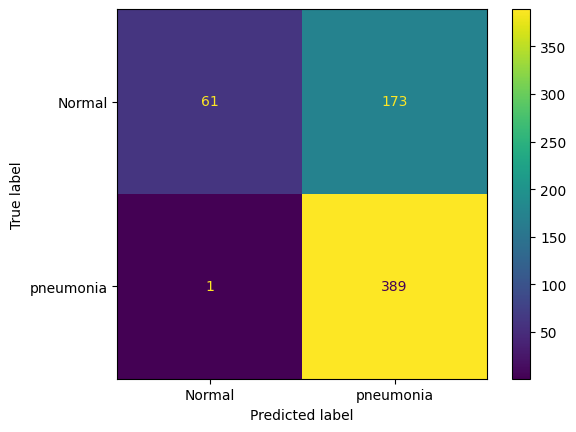

In [ ]:
print(f"ResNet Accuracy: {resnet_accuracy*100:.2f}%")
print(f"ResNet F1 Score: {resnet_f1*100:.2f}%")
print(f"ResNet Precision: {resnet_precision*100:.2f}%")
print(f"ResNet Recall: {resnet_recall*100:.2f}%")
classes = ['Normal', 'pneumonia']
disp = ConfusionMatrixDisplay(confusion_matrix=resnet_confusion, display_labels=classes)
disp.plot(
    include_values=True,
    cmap='viridis',
    ax=None,
    xticks_rotation='horizontal',
    values_format='d'
)

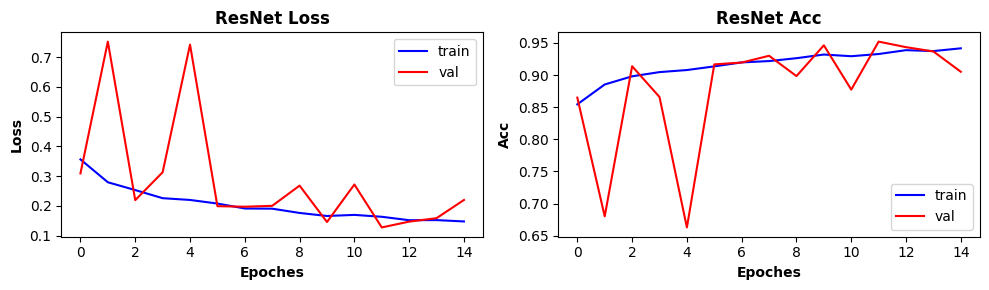

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 3))
data = [
    (train_loss_history_resnet, val_loss_history_resnet, 'ResNet Loss'),
    (train_acc_history_resnet, val_acc_history_resnet, 'ResNet Acc')
]

for i, (tr, val, title) in enumerate(data):
    ax[i].plot(np.arange(15), tr, label='train', color='blue')
    ax[i].plot(np.arange(15), val, label='val', color='red')
    ax[i].set_xlabel('Epoches', fontweight='bold')
    ax[i].set_ylabel('Loss' if title == 'ResNet Loss' else 'Acc', fontweight='bold')
    ax[i].set_title(title, fontweight='bold')
    ax[i].legend()

plt.tight_layout()
plt.show()